In [ ]:
%load_ext autoreload
%autoreload 2
from utils_dir import get_curr_dir, include_home_dir
include_home_dir()

import numpy as np
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit
import pandas_datareader.data as web
import datetime
from datetime import timedelta

import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams["text.usetex"] = False

from jumpmodels.utils import filter_date_range        # useful helpers
from feature import DataLoader
from jumpmodels.preprocess import DataClipperStd, StandardScalerPD
from jumpmodels.plot import plot_regimes_and_cumret, savefig_plt

from jumpmodels.jump_kernel_limitedspec import JumpModel                 # class of JM & CJM
from jumpmodels.sparse_jump import SparseJumpModel    # class of Sparse JM

import warnings
warnings.filterwarnings("ignore", message=".*use_label_encoder.*")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Settings

In [25]:
datadict = 'data/'
asset = 'UST10'
assetfile = 'TRXVUSGOV10U(TOT_RETURN)_import'
datastart = '1982-01-11'
valstart = '1994-01-01'
teststart = '2004-01-01'
dataend = '2025-03-31'

pcafile = "pca_scores_dynamic_ewrb5.csv"
nsfile = "LSC_output_USD_1980_2025.csv"

rfticker  = "DGS3MO"
benchfile = 'data/lbustruu.csv'
benchticker = "AggBond"

# extention for multiple setting analysis
pca5 = "_pca5"
ns = "ns"
pca5online = "_pca5online"
nsonline = "nsonline"

ext_features_file = "data/ext_features_pre.csv"
bi5_file = "data/usggbe05.csv"
bi10_file = "data/usggbe10.csv"
move_file = "data/move.csv"
volfile = "UST10GARCH_vol.csv"


hls = [5,63]
hlte = "5,63_rq+linear_ker+rqsp"

In [26]:
n_components = 2
jump_penalty = 1000
## Define JumpModel
jm_setting = dict(
    n_components=n_components,
    #jump_penalty=jump_penalty,#set in each application
    cont=True,
    #kernel = 'linear+rq',kernel_params = {'length_scale' : 100, 'alpha' : 20},#n_kernel_features = 1000, # set in each application
    use_spectral_penalty = True, sp_kernel = 'rq', sp_kernel_params = {'alpha': 20, 'length_scale':100}, normalize_laplacian = False,
    )


## Data Preparation

In [27]:
df = pd.read_csv(datadict + assetfile + '.csv',index_col = 0)
df = df.reset_index()
df = df.rename(columns={"Date": "date"})
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values("date", ascending=True)
df["ret"] = np.log(df[".TRXVUSGOV10U (TOT_RETURN)"]).diff() # log returns
data1 = df[["date", "ret"]].dropna()
ret_ser = pd.Series(
    data1["ret"].values,
    index=data1["date"],
    name=asset
)

class DataObj:
    pass

data_obj = DataObj()
data_obj.ret = ret_ser
pd.to_pickle(data_obj, datadict + asset + ".pkl")

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/3414546814.py:4: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df["date"] = pd.to_datetime(df["date"])


In [28]:
class DataObj:
    pass
# daily data is from 1980-01-01
dl = DataLoader(ticker=asset, ver="v0").load(start_date=datastart, end_date=dataend)

print("Daily returns stored in `data.ret_ser`:", "-"*50, sep="\n")
print(dl.ret_ser, "-"*50, sep="\n")
print("Features stored in `data.X`:", "-"*50, sep="\n")
print(dl.X)

Daily returns stored in `data.ret_ser`:
--------------------------------------------------
date
1982-01-11   -0.015971
1982-01-12    0.010590
1982-01-13   -0.010331
1982-01-14    0.006727
1982-01-15   -0.004911
                ...   
2025-03-24   -0.006368
2025-03-26   -0.000698
2025-03-27   -0.001434
2025-03-28    0.008694
2025-03-31    0.003802
Name: UST10, Length: 11272, dtype: float64
--------------------------------------------------
Features stored in `data.X`:
--------------------------------------------------
               ret_5  DD-log_5  sortino_5    ret_20  DD-log_20  sortino_20    ret_60  DD-log_60  sortino_60
date                                                                                                       
1982-01-11 -0.003413 -4.817972  -0.422206 -0.000861  -5.010518   -0.129192  0.000045  -5.117899    0.007515
1982-01-12 -0.001600 -4.887287  -0.212159 -0.000471  -5.027846   -0.071922  0.000166  -5.123688    0.027946
1982-01-13 -0.002730 -4.833562  -0.343076 -0.

In [29]:
# add nsloading features
pcload_raw = pd.read_csv(pcafile, index_col=0, parse_dates=True)
start, end = datastart, dataend
PC1 = pcload_raw.loc[start:end, "PC1"]
PC2 = pcload_raw.loc[start:end, "PC2"]
PC3  = pcload_raw.loc[start:end, "PC3"]
PC4 = pcload_raw.loc[start:end, "PC4"]
PC5 = pcload_raw.loc[start:end, "PC5"]

pcload = pd.concat([PC1, PC2, PC3,PC4, PC5], axis=1)
pcfeatures = pd.DataFrame(index = pcload.index)

for hl in hls:
    #pcfeatures[f"PC1_ewma_{hl}"] = pcload["PC1"].ewm(halflife=hl).mean()
    pcfeatures[f"PC1_diff_ewma_{hl}"] = pcload["PC1"].diff().ewm(halflife=hl).mean()
    #pcfeatures[f"PC2_ewma_{hl}"] = pcload["PC2"].ewm(halflife=hl).mean()
    pcfeatures[f"PC2_diff_ewma_{hl}"] = pcload["PC2"].diff().ewm(halflife=hl).mean()
    #pcfeatures[f"PC3_ewma_{hl}"] = pcload["PC3"].ewm(halflife=hl).mean()
    pcfeatures[f"PC3_diff_ewma_{hl}"] = pcload["PC3"].diff().ewm(halflife=hl).mean()
    #pcfeatures[f"PC4_ewma_{hl}"] = pcload["PC4"].ewm(halflife=hl).mean()
    pcfeatures[f"PC4_diff_ewma_{hl}"] = pcload["PC4"].diff().ewm(halflife=hl).mean()
    #pcfeatures[f"PC5_ewma_{hl}"] = pcload["PC5"].ewm(halflife=hl).mean()
    pcfeatures[f"PC5_diff_ewma_{hl}"] = pcload["PC5"].diff().ewm(halflife=hl).mean()
pcfeatures = pcfeatures.dropna()
pc_df = pcfeatures
#missing_dates = dl.X.index.difference(pc_df.index)
pc_aligned = pc_df.reindex(dl.X.index, method="ffill")
X_with_pc = pd.concat([dl.X, pc_aligned], axis=1, join = "inner")
X_with_pc = X_with_pc.fillna(method="bfill")

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/121637825.py:29: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X_with_pc = X_with_pc.fillna(method="bfill")


In [30]:
# add nsloading features
nsload_raw = pd.read_csv(nsfile, index_col=0, parse_dates=True)
start, end = datastart, dataend
level = nsload_raw.loc[start:end, "Level"]
slope = nsload_raw.loc[start:end, "Slope"]
curv  = nsload_raw.loc[start:end, "Curvature"]

nsload = pd.concat([level, slope, curv], axis=1)
nsfeatures = pd.DataFrame(index = nsload.index)

for hl in hls:
    #nsfeatures[f"level_ewma_{hl}"] = nsload["Level"].ewm(halflife=hl).mean()
    nsfeatures[f"level_diff_ewma_{hl}"] = nsload["Level"].diff().ewm(halflife=hl).mean()
    #nsfeatures[f"slope_ewma_{hl}"] = nsload["Slope"].ewm(halflife=hl).mean()
    nsfeatures[f"slope_diff_ewma_{hl}"] = nsload["Slope"].diff().ewm(halflife=hl).mean()
    #nsfeatures[f"curv_ewma_{hl}"] = nsload["Curvature"].ewm(halflife=hl).mean()
    nsfeatures[f"curv_diff_ewma_{hl}"] = nsload["Curvature"].diff().ewm(halflife=hl).mean()
#nsfeatures["level"] = nsload["Level"]
#nsfeatures["level_diff"] = nsload["Level"].diff().fillna(0)
#nsfeatures["slope"] = nsload["Slope"]
#nsfeatures["slope_diff"] = nsload["Slope"].diff().fillna(0)
#nsfeatures["curv"] = nsload["Curvature"]
#nsfeatures["curv_diff"] = nsload["Curvature"].diff().fillna(0)
nsfeatures = nsfeatures.dropna()

ns_df = nsfeatures
#missing_dates = dl.X.index.difference(ns_df.index)
ns_aligned = ns_df.reindex(dl.X.index, method="ffill")
X_with_ns = pd.concat([dl.X, ns_aligned], axis=1, join = "inner")
X_with_ns = X_with_ns.fillna(method="bfill")

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/3404038193.py:30: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X_with_ns = X_with_ns.fillna(method="bfill")


## Train Test Split

In [31]:
settings = {
    'base'      : dl.X,
    'NS'        : X_with_ns,
    'PCA'       : X_with_pc,
}

In [32]:
train_splits = {}
val_splits   = {}
test_splits  = {}
clipped_train = {}
clipped_val    = {}
clipped_test  = {}
processed_train = {}
processed_val    = {}
processed_test  = {}
inf_nan_report = {}

datastart  = pd.to_datetime(datastart)
valstart   = pd.to_datetime(valstart)
teststart  = pd.to_datetime(teststart)
dataend    = pd.to_datetime(dataend)


for name, X in settings.items():

    X_train = filter_date_range(X, start_date=datastart, end_date=valstart- timedelta(days=1))
    X_val  = filter_date_range(X, start_date=valstart, end_date=teststart- timedelta(days=1))
    X_test = filter_date_range(X, start_date=teststart, end_date=dataend)

    train_splits[name] = X_train
    val_splits[name]   = X_val
    test_splits[name]  = X_test

    clipper = DataClipperStd(mul=4.)
    Xc_train = clipper.fit_transform(X_train)
    Xc_val   = clipper.transform(X_val)
    Xc_test  = clipper.transform(X_test)

    def clean_df(df):
        df2 = df.replace([np.inf, -np.inf], np.nan)
        return df2.fillna(df2.mean())
    Xc_train_clean = clean_df(Xc_train)
    Xc_val_clean   = clean_df(Xc_val)
    Xc_test_clean  = clean_df(Xc_test)

    scaler = StandardScalerPD()
    X_train_proc = scaler.fit_transform(Xc_train_clean)
    X_val_proc   = scaler.transform(Xc_val_clean)
    X_test_proc  = scaler.transform(Xc_test_clean)

    clipped_train[name]    = Xc_train
    clipped_val[name]      = Xc_val
    clipped_test[name]     = Xc_test
    processed_train[name]  = X_train_proc
    processed_val[name]    = X_val_proc
    processed_test[name]   = X_test_proc

    def report(df):
        arr = df.values if hasattr(df, "values") else df
        return {
            'has_inf': np.isinf(arr).any(),
            'has_nan': np.isnan(arr).any()
        }
    inf_nan_report[name] = {
        'train_raw': report(Xc_train),
        'train_clean': report(Xc_train_clean),
        'val_raw': report(Xc_val),
        'val_clean': report(Xc_val_clean),
        'test_raw': report(Xc_test),
        'test_clean': report(Xc_test_clean),
    }

    ts, te = X_train.index[[0, -1]]
    us, ue = X_val.index [[0, -1]]
    vs, ve = X_test.index [[0, -1]]
    rpt = inf_nan_report[name]
    print(f"[{name}] train: {ts}〜{te} | validation {us} ~ {ue} |test: {vs}〜{ve}")
    print(f"  raw train—inf? {rpt['train_raw']['has_inf']}, nan? {rpt['train_raw']['has_nan']}")
    print(f"  clean train—inf? {rpt['train_clean']['has_inf']}, nan? {rpt['train_clean']['has_nan']}")
    print(f"  raw val   —inf? {rpt['val_raw']['has_inf']}, nan? {rpt['val_raw']['has_nan']}")
    print(f"  clean val —inf? {rpt['val_clean']['has_inf']}, nan? {rpt['val_clean']['has_nan']}")
    print(f"  raw test —inf? {rpt['test_raw']['has_inf']}, nan? {rpt['test_raw']['has_nan']}")
    print(f"  clean test —inf? {rpt['test_clean']['has_inf']}, nan? {rpt['test_clean']['has_nan']}\n")

[base] train: 1982-01-11 00:00:00〜1993-12-31 00:00:00 | validation 1994-01-03 00:00:00 ~ 2003-12-31 00:00:00 |test: 2004-01-01 00:00:00〜2025-03-31 00:00:00
  raw train—inf? False, nan? False
  clean train—inf? False, nan? False
  raw val   —inf? False, nan? False
  clean val —inf? False, nan? False
  raw test —inf? False, nan? False
  clean test —inf? False, nan? False

[NS] train: 1982-01-11 00:00:00〜1993-12-31 00:00:00 | validation 1994-01-03 00:00:00 ~ 2003-12-31 00:00:00 |test: 2004-01-01 00:00:00〜2025-03-31 00:00:00
  raw train—inf? False, nan? False
  clean train—inf? False, nan? False
  raw val   —inf? False, nan? False
  clean val —inf? False, nan? False
  raw test —inf? False, nan? False
  clean test —inf? False, nan? False

[PCA] train: 1982-01-11 00:00:00〜1993-12-31 00:00:00 | validation 1994-01-03 00:00:00 ~ 2003-12-31 00:00:00 |test: 2004-01-01 00:00:00〜2025-03-31 00:00:00
  raw train—inf? False, nan? False
  clean train—inf? False, nan? False
  raw val   —inf? False, nan?

## Preparation for performance evaluation

In [33]:
start_date = datastart
end_date   = dataend

rf_yield = web.DataReader(rfticker, "fred", start_date, end_date)
rf_yield = rf_yield.resample("B").ffill()
rf_yield = rf_yield / 100.0

rf_daily = np.log(1+rf_yield[rfticker]) / 252.0
rf_test = rf_daily

In [34]:
df = pd.read_csv(benchfile,index_col = 0, skiprows = 5)
df = df.reset_index()
df = df.rename(columns={"Date": "date"})
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values("date", ascending=True)
df["ret"] = np.log(df["TOT_RETURN_INDEX_GROSS_DVDS"]).diff() # log returns
data1 = df[["date", "ret"]].dropna()
bench = pd.Series(
    data1["ret"].values,
    index=data1["date"],
    name=benchticker
)

In [35]:
def compute_performance(
    ret_series: pd.Series,
    rf_series: pd.Series = None,
    freq: int = 252,
    benchmark: pd.Series = None
) -> pd.DataFrame:
    """
    """
    if rf_series is None:
        rf_aligned = pd.Series(0.0, index=ret_series.index)
    else:
        rf_aligned = rf_series.reindex(ret_series.index, method="ffill").fillna(0.0)

    excess_log_ret = ret_series - rf_aligned

    mu = excess_log_ret.mean()        # 日次超過対数リターンの平均
    sigma = ret_series.std(ddof=0)
    sharpe = np.nan
    if sigma > 0:
        sharpe = (mu * freq) / (sigma * np.sqrt(freq))

    ann_return = mu * freq
    ann_vol    = sigma * np.sqrt(freq)

    cumlog = excess_log_ret.cumsum()
    cumret = np.exp(cumlog)

    running_max = cumret.cummax()
    drawdown   = cumret / running_max - 1.0
    max_dd     = drawdown.min()

    down_ret = excess_log_ret.copy()
    down_ret[down_ret > 0] = 0.0
    dd_daily = down_ret.std(ddof=0)
    sortino = np.nan
    if dd_daily > 0:
        sortino = (mu * freq) / (dd_daily * np.sqrt(freq))

    var_99 = np.nanpercentile(excess_log_ret, 1)
    cvar_99 = excess_log_ret[excess_log_ret <= var_99].mean()

    ir = np.nan
    if benchmark is not None:
        bp = benchmark.reindex(ret_series.index, method="ffill").fillna(0.0)
        active = ret_series - bp
        mu_a = active.mean()       # 平均超過リターン（日次）
        sigma_a = active.std(ddof=0)
        if sigma_a > 0:
            ir = (mu_a * freq) / (sigma_a * np.sqrt(freq))

    calmar = np.nan
    if max_dd != 0:
        calmar = ann_return / abs(max_dd)

    df = pd.DataFrame( {
        "annual_return": ann_return,
        "annual_vol": ann_vol,
        "sharpe": sharpe,
        "max_drawdown": max_dd,
        "sortino": sortino,
        "cvar_99": cvar_99,
        "calmar": calmar,
        "information_ratio": ir,
        #"cumret_series": cumret,    # 完整な累積資産価値（Series）も返す
        #"drawdown_series": drawdown
    },index=[0] )

    return df

## Explanatory Variables

In [36]:
ext_features_pre = pd.read_csv(ext_features_file, index_col=0, parse_dates=True)
ext_features_pre = ext_features_pre.reindex(dl.X.index, method="ffill")

In [37]:
bi5_raw = pd.read_csv(bi5_file,index_col = 0, skiprows = 5)
bi5_raw = bi5_raw.reset_index()
bi5_raw = bi5_raw.rename(columns={"Date": "date"})
bi5_raw["date"] = pd.to_datetime(bi5_raw["date"])
bi5_raw = bi5_raw.sort_values("date", ascending=True)
bi5_raw.set_index("date", inplace=True)

bi10_raw = pd.read_csv(bi10_file,index_col = 0, skiprows = 5)
bi10_raw = bi10_raw.reset_index()
bi10_raw = bi10_raw.rename(columns={"Date": "date"})
bi10_raw["date"] = pd.to_datetime(bi10_raw["date"])
bi10_raw = bi10_raw.sort_values("date", ascending=True)
bi10_raw.set_index("date", inplace=True)



bi =pd.DataFrame(index=bi10_raw.index)
#bi["bi2_logdiff_ewma"] = np.log(bi2_raw["PX_LAST"]).diff().ewm(halflife=5).mean()
bi["bi5_logdiff_ewma"] = np.log(bi5_raw["PX_LAST"]).diff().ewm(halflife=5).mean()
bi["bi10_logdiff_ewma"] = np.log(bi10_raw["PX_LAST"]).diff().ewm(halflife=5).mean()
bi_aligned = bi.reindex(ext_features_pre.index, method="ffill")
#bi_aligned.isna().sum()
bi_aligned = bi_aligned.fillna(method="bfill")

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/1470801452.py:23: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  bi_aligned = bi_aligned.fillna(method="bfill")


In [38]:
move_raw = pd.read_csv(move_file, index_col = 0, skiprows = 6)
move_raw = move_raw.reset_index()
move_raw = move_raw.rename(columns={"Date": "date"})
move_raw["date"] = pd.to_datetime(move_raw["date"])
move_raw = move_raw.sort_values("date", ascending=True)
move_raw.set_index("date", inplace=True)
move = pd.DataFrame(index=move_raw.index)
move["move_logdiff_ewma"] = np.log(move_raw["PX_LAST"]).diff().ewm(halflife=5).mean()
move_aligned = move.reindex(ext_features_pre.index, method="ffill")

In [39]:
vol_df = pd.read_csv(volfile, index_col=0)
vol_df = vol_df.reset_index()
vol_df = vol_df.sort_values("date", ascending=True)
vol_df["date"] = pd.to_datetime(vol_df["date"])
vol_df.set_index("date",inplace = True)
vol = pd.DataFrame(index = vol_df.index)
vol["vol_diff_ewma"] = vol_df["volatility"].diff().ewm(halflife=5).mean()
vol_aligned = vol.reindex(ext_features_pre.index, method="ffill")

In [40]:
ext_features_pre = pd.concat([ext_features_pre, bi_aligned, 
                       move_aligned, 
                       vol_aligned], axis=1, join="inner")
ext_features_pre2 = ext_features_pre.drop(columns=["slope_diff_ewm"])
ext_features_pre_with_ns = pd.concat([ext_features_pre2, ns_aligned], axis=1, join="inner")
ext_features_pre_with_pc = pd.concat([ext_features_pre2, pc_aligned], axis=1, join="inner")

## In-sample performance of JM

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/15749503.py:76: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/15749503.py:76: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/15749503.py:76: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()



=== base ===
Cluster centers:
            ret_5  DD-log_5  sortino_5    ret_20  DD-log_20  sortino_20    ret_60  DD-log_60  sortino_60
Regime0  0.482719 -0.473106   0.500501  0.631375  -0.440348    0.675341  0.566476   -0.31623    0.638748
Regime1 -0.565241  0.553984  -0.586062 -0.739310   0.515627   -0.790792 -0.663316    0.37029   -0.747944

Buy&Hold performance:
   annual_return  annual_vol    sharpe  max_drawdown  sortino   cvar_99    calmar  information_ratio
0       0.055026    0.074419  0.739408     -0.179345  1.26077 -0.015049  0.306816          -6.133968

JM strategy performance:
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.105173     0.05071  2.074019     -0.042021  3.819432 -0.010837  2.502853           -6.07301


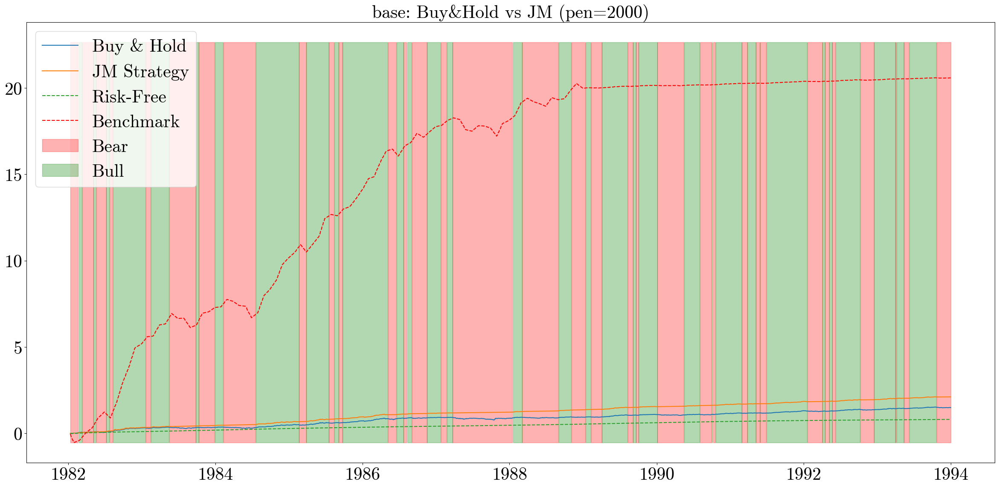


=== NS ===
Cluster centers:
            ret_5  DD-log_5  sortino_5    ret_20  DD-log_20  sortino_20    ret_60  DD-log_60  sortino_60  level_diff_ewma_5  slope_diff_ewma_5  curv_diff_ewma_5  level_diff_ewma_63  slope_diff_ewma_63  curv_diff_ewma_63
Regime0  0.518963 -0.456943   0.542069  0.694454  -0.412757    0.740555  0.638502  -0.287858    0.706280          -0.207052          -0.206828         -0.280690           -0.267092           -0.177028          -0.352344
Regime1 -0.528350  0.465208  -0.551874 -0.707015   0.420223   -0.753950 -0.650052   0.293064   -0.719055           0.210797           0.210570          0.285767            0.271923            0.180231           0.358717

Buy&Hold performance:
   annual_return  annual_vol    sharpe  max_drawdown  sortino   cvar_99    calmar  information_ratio
0       0.055026    0.074419  0.739408     -0.179345  1.26077 -0.015049  0.306816          -6.133968

JM strategy performance:
   annual_return  annual_vol    sharpe  max_drawdown   sorti

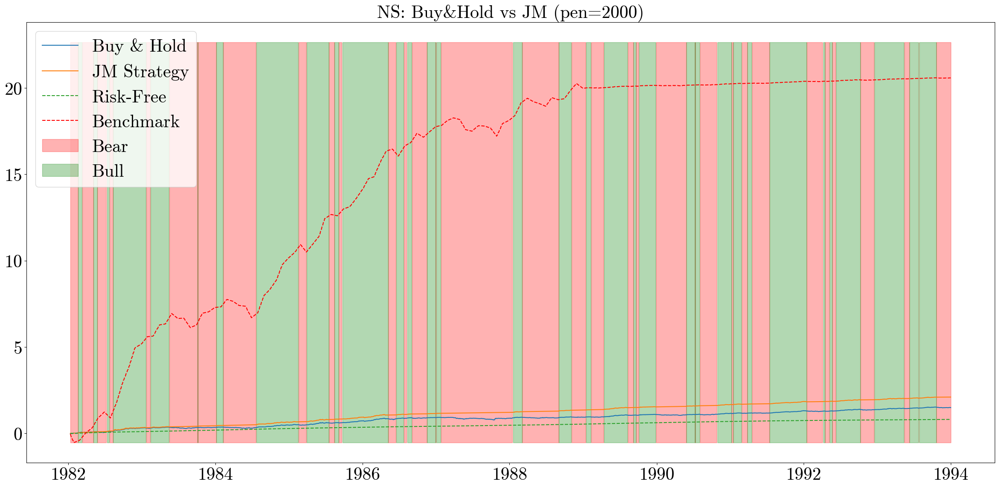


=== PCA ===
Cluster centers:
            ret_5  DD-log_5  sortino_5    ret_20  DD-log_20  sortino_20    ret_60  DD-log_60  sortino_60  PC1_diff_ewma_5  PC2_diff_ewma_5  PC3_diff_ewma_5  PC4_diff_ewma_5  PC5_diff_ewma_5  PC1_diff_ewma_63  PC2_diff_ewma_63  PC3_diff_ewma_63  PC4_diff_ewma_63  PC5_diff_ewma_63
Regime0  0.573027 -0.442153   0.585781  0.745962  -0.386086    0.787256  0.661239  -0.254994    0.723964        -0.296929        -0.032548         0.076351        -0.001645        -0.029893         -0.441406         -0.000893          0.126339          0.057697          0.021137
Regime1 -0.531995  0.410493  -0.543836 -0.692547   0.358440   -0.730884 -0.613891   0.236735   -0.672125         0.275667         0.030218        -0.070884         0.001527         0.027752          0.409799          0.000829         -0.117293         -0.053566         -0.019623

Buy&Hold performance:
   annual_return  annual_vol    sharpe  max_drawdown  sortino   cvar_99    calmar  information_ratio
0     

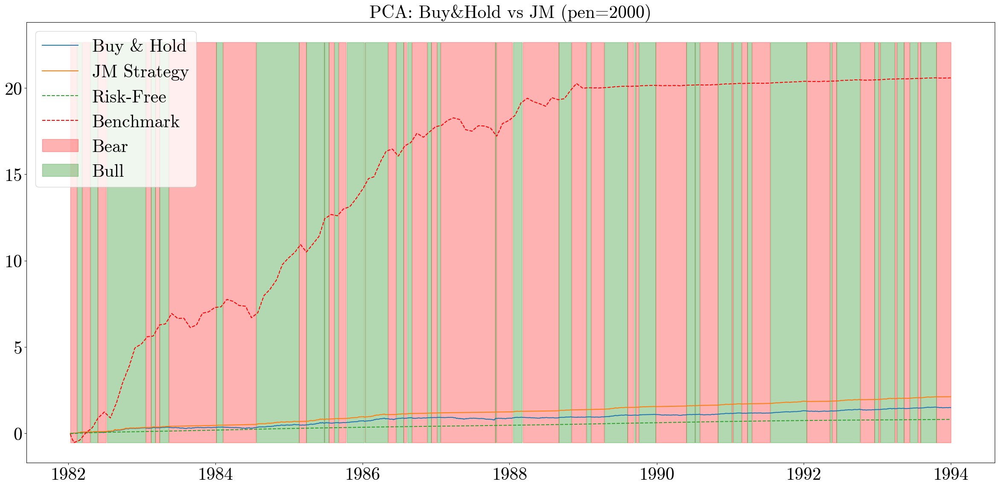

<Figure size 2400x1200 with 0 Axes>

<Figure size 2400x1200 with 0 Axes>

<Figure size 2400x1200 with 0 Axes>

In [41]:
jump_penalty = 2000

# 結果格納用
centers_dict_insamp    = {}
perf_bh_dict_insamp    = {}
perf_jm_dict_insamp    = {}
figures_dict_insamp    = {}

for name in settings:
    X_tr = processed_train[name]

    # --- JumpModel の適用 ---
    #jm = JumpModel(
    #    n_components=n_components,
    #    jump_penalty=jump_penalty,
    #    cont=True,
    #    kernel = 'linear+rq',kernel_params = {'length_scale' : 100, 'alpha' : 20},n_kernel_features = 1000,
    #    use_spectral_penalty = True, sp_kernel_params = {'gamma': 1}, normalize_laplacian = False,
    #)
    jm = JumpModel(**jm_setting, jump_penalty=jump_penalty, n_kernel_features = 1000)
    jm.fit(X_tr, dl.ret_ser, sort_by="cumret")
    labels = jm.labels_          # pd.Series: index が学習データ期間
    regime = 1 - labels          # 1: Bull, 0: Bear

    # 2) そのインデックスに合わせてリターンと無リスク金利をリインデックス
    ret_test = dl.ret_ser.reindex(labels.index).dropna()
    rf  = rf_test .reindex(labels.index).fillna(0.0)

    centers_orig = X_tr.groupby(jm.labels_).mean()
    centers_orig.index = [f"Regime{i}" for i in centers_orig.index]
    centers_dict_insamp[name] = centers_orig

    #centers = pd.DataFrame(jm.centers_,index=[f"Regime{i}" for i in range(n_components)],columns=X_tr.columns)
    #centers_dict_insamp[name] = centers

    # Buy&Hold パフォーマンス
    perf_bh = compute_performance(
        ret_series=ret_test,
        rf_series=rf,
        freq=252,
        benchmark=bench
    )
    perf_bh_dict_insamp[name] = perf_bh

    # JM ストラテジー（ベア期は無リスク）
    rf_aligned      = rf.reindex(ret_test.index, method="ffill").fillna(0.0)
    ret_is_jm       = ret_test.where(regime == 1, other=rf_aligned)
    perf_jm = compute_performance(
        ret_series=ret_is_jm,
        rf_series=rf,
        freq=252,
        benchmark=bench
    )
    perf_jm_dict_insamp[name] = perf_jm

    # --- プロット ---
    cum_bh   = ret_test.cumsum()
    cum_jm   = ret_is_jm.cumsum()
    cum_bench = bench.reindex(ret_test.index, method="ffill").fillna(0.0).cumsum()
    plt.figure()
    fig = plt.figure(tight_layout=True)
    ax  = fig.add_subplot(1,1,1)
    ax.plot(cum_bh.index,cum_bh,label="Buy & Hold")
    ax.plot(cum_jm.index,cum_jm,label="JM Strategy")
    ax.plot(rf_aligned.index,rf_aligned.cumsum(),label="Risk-Free", linestyle="--")
    ax.plot(cum_bench.index,cum_bench,label="Benchmark", linestyle='--', color='red')
    #cum_bh.plot(label="Buy & Hold")
    #cum_jm.plot(label="JM Strategy")
    #rf_aligned.cumsum().plot(label="Risk-Free", linestyle="--")
    #cum_bench.plot(label="Benchmark", linestyle='--', color='red')
    ax.fill_between(cum_bh.index, min(min(rf_aligned.cumsum()),min(cum_bh),min(cum_jm),min(cum_bench)),max(max(rf_aligned.cumsum()),max(cum_bh),max(cum_jm),max(cum_bench))*1.1,where=regime == 0, alpha=0.3, label="Bear" , color = "red")
    ax.fill_between(cum_bh.index, min(min(rf_aligned.cumsum()),min(cum_bh),min(cum_jm),min(cum_bench)),max(max(rf_aligned.cumsum()),max(cum_bh),max(cum_jm),max(cum_bench))*1.1,where=regime == 1, alpha=0.3, label="Bull",color = "green")
    ax.set_title(f"{name}: Buy&Hold vs JM (pen={jump_penalty})")
    ax.legend(loc="upper left")
    #plt.tight_layout()
    fig.show()


    # 図を保存 or 辞書に保持
    figures_dict_insamp[name] = plt.gcf()
    # savefig_plt(f"jm_strategy_{name}.png")  # もしファイル保存したい場合

    plt.close(fig)

# --- まとめ出力例 ---
for name in settings:
    print(f"\n=== {name} ===")
    print("Cluster centers:")
    print(centers_dict_insamp[name])
    print("\nBuy&Hold performance:")
    print(perf_bh_dict_insamp[name])
    print("\nJM strategy performance:")
    print(perf_jm_dict_insamp[name])
    # プロット表示
    display(figures_dict_insamp[name])


   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.078686    0.045101  1.744658     -0.042373  2.963186 -0.010751  1.857015           1.294048


/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/738547726.py:59: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


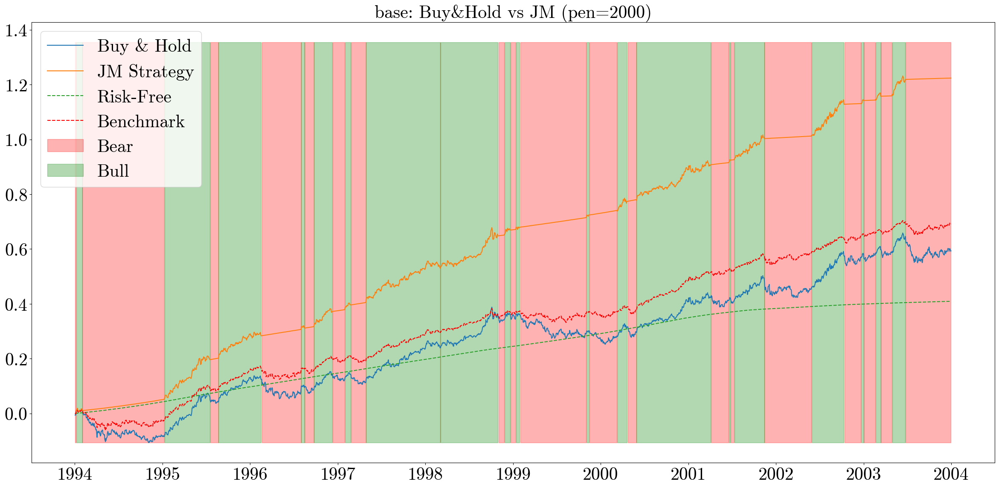

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.073889     0.04521  1.634367     -0.042531  2.756394 -0.010829  1.737322           1.171786


/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/738547726.py:59: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


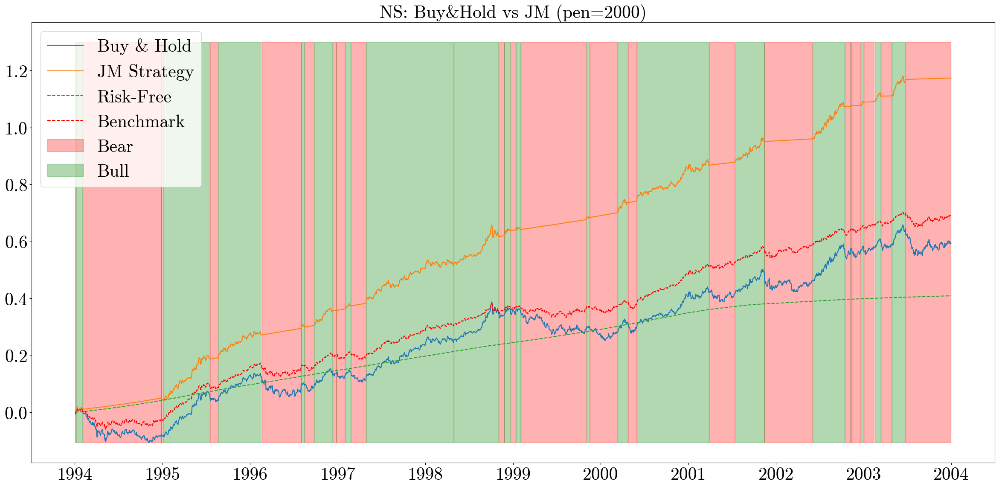

   annual_return  annual_vol    sharpe  max_drawdown  sortino   cvar_99    calmar  information_ratio
0       0.082456    0.045778  1.801214     -0.042373  3.07986 -0.010785  1.945987           1.395232


/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/738547726.py:59: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


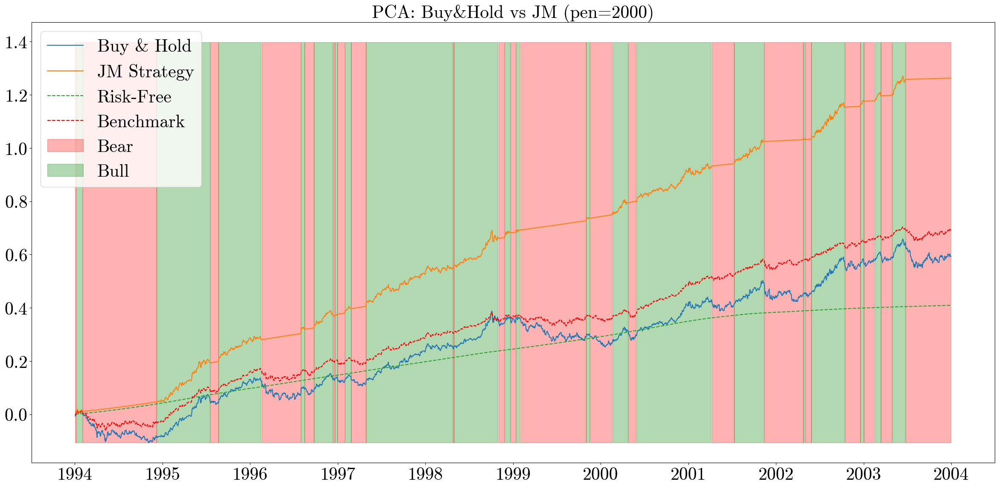

<Figure size 2400x1200 with 0 Axes>

<Figure size 2400x1200 with 0 Axes>

<Figure size 2400x1200 with 0 Axes>

In [42]:
jump_penalty = 2000

for name in settings:
    X_tr = processed_val[name]

    # --- JumpModel の適用 ---
    jm = JumpModel(**jm_setting, jump_penalty=jump_penalty, n_kernel_features = 1000)
    jm.fit(X_tr, dl.ret_ser, sort_by="cumret")
    labels = jm.labels_          # pd.Series: index が学習データ期間
    regime = 1 - labels          # 1: Bull, 0: Bear

    # 2) そのインデックスに合わせてリターンと無リスク金利をリインデックス
    ret_test = dl.ret_ser.reindex(labels.index).dropna()
    rf  = rf_test .reindex(labels.index).fillna(0.0)

    centers_orig = X_tr.groupby(jm.labels_).mean()
    centers_orig.index = [f"Regime{i}" for i in centers_orig.index]
    centers_dict_insamp[name] = centers_orig

    # Buy&Hold パフォーマンス
    perf_bh = compute_performance(
        ret_series=ret_test,
        rf_series=rf,
        freq=252,
        benchmark=bench
    )

    # JM ストラテジー（ベア期は無リスク）
    rf_aligned      = rf.reindex(ret_test.index, method="ffill").fillna(0.0)
    ret_is_jm       = ret_test.where(regime == 1, other=rf_aligned)
    perf_jm = compute_performance(
        ret_series=ret_is_jm,
        rf_series=rf,
        freq=252,
        benchmark=bench
    )
    print(perf_jm)

    # --- プロット ---
    cum_bh   = ret_test.cumsum()
    cum_jm   = ret_is_jm.cumsum()
    cum_bench = bench.reindex(ret_test.index, method="ffill").fillna(0.0).cumsum()
    plt.figure()
    fig = plt.figure(tight_layout=True)
    ax  = fig.add_subplot(1,1,1)
    ax.plot(cum_bh.index,cum_bh,label="Buy & Hold")
    ax.plot(cum_jm.index,cum_jm,label="JM Strategy")
    ax.plot(rf_aligned.index,rf_aligned.cumsum(),label="Risk-Free", linestyle="--")
    ax.plot(cum_bench.index,cum_bench,label="Benchmark", linestyle='--', color='red')
    #cum_bh.plot(label="Buy & Hold")
    #cum_jm.plot(label="JM Strategy")
    #rf_aligned.cumsum().plot(label="Risk-Free", linestyle="--")
    #cum_bench.plot(label="Benchmark", linestyle='--', color='red')
    ax.fill_between(cum_bh.index, min(min(rf_aligned.cumsum()),min(cum_bh),min(cum_jm),min(cum_bench)),max(max(rf_aligned.cumsum()),max(cum_bh),max(cum_jm),max(cum_bench))*1.1,where=regime == 0, alpha=0.3, label="Bear" , color = "red")
    ax.fill_between(cum_bh.index, min(min(rf_aligned.cumsum()),min(cum_bh),min(cum_jm),min(cum_bench)),max(max(rf_aligned.cumsum()),max(cum_bh),max(cum_jm),max(cum_bench))*1.1,where=regime == 1, alpha=0.3, label="Bull",color = "green")
    ax.set_title(f"{name}: Buy&Hold vs JM (pen={jump_penalty})")
    ax.legend(loc="upper left")
    #plt.tight_layout()
    fig.show()

    plt.close(fig)
    display(fig)

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99   calmar  information_ratio
0       0.079888    0.049888  1.601328      -0.05936  2.794568 -0.011429  1.34582           1.549815


/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/673682057.py:59: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


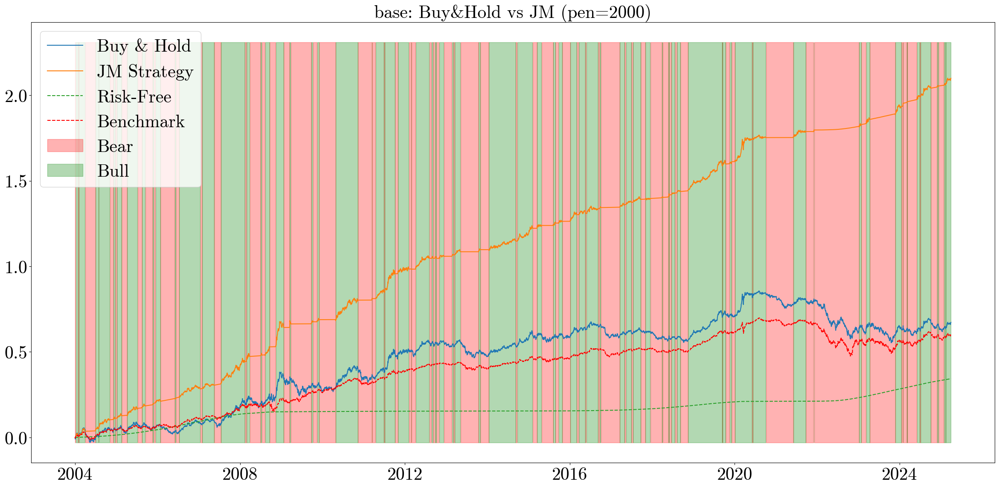

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.081729    0.052336  1.561633      -0.05936  2.726187 -0.011686  1.376842           1.608583


/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/673682057.py:59: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


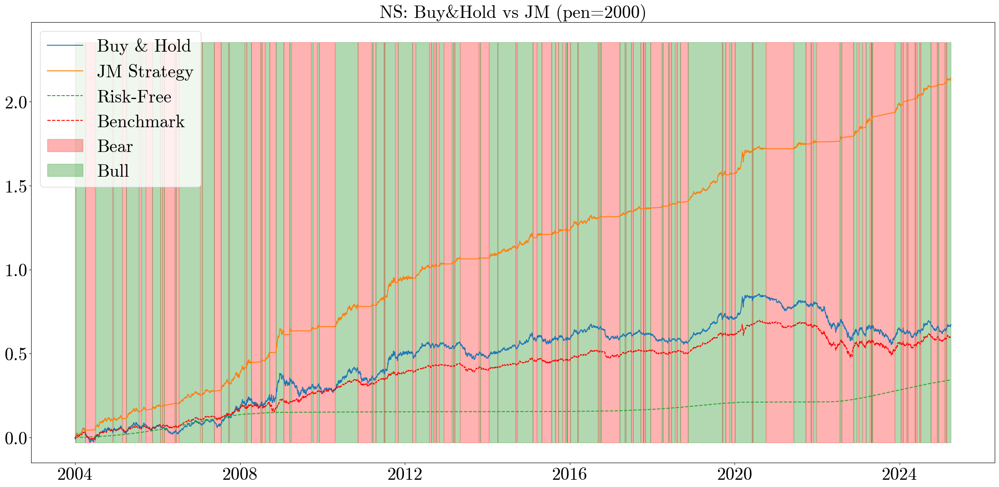

   annual_return  annual_vol    sharpe  max_drawdown   sortino  cvar_99    calmar  information_ratio
0       0.081791    0.049963  1.637032      -0.05936  2.872612 -0.01136  1.377886           1.598881


/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/673682057.py:59: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


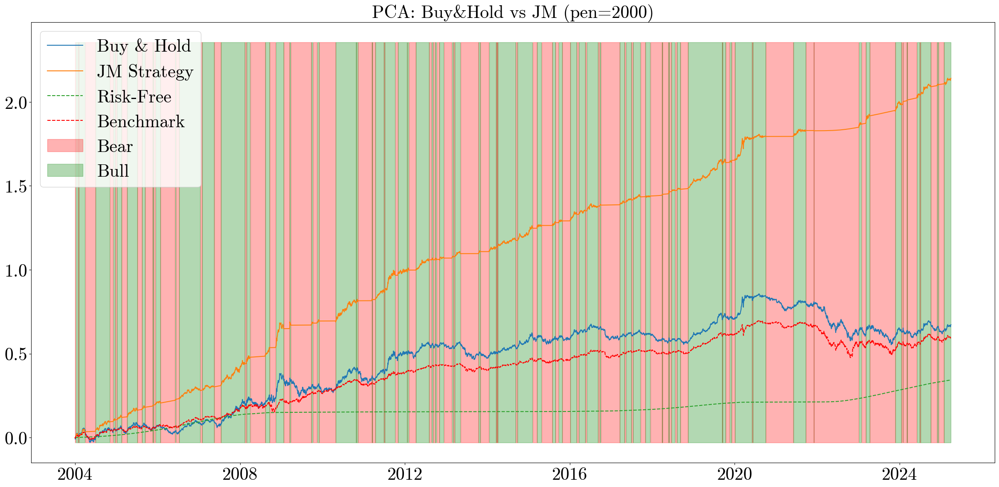

<Figure size 2400x1200 with 0 Axes>

<Figure size 2400x1200 with 0 Axes>

<Figure size 2400x1200 with 0 Axes>

In [43]:
jump_penalty = 2000

for name in settings:
    X_tr = processed_test[name]

    # --- JumpModel の適用 ---
    jm = JumpModel(**jm_setting, jump_penalty=jump_penalty, n_kernel_features = 1000)
    jm.fit(X_tr, dl.ret_ser, sort_by="cumret")
    labels = jm.labels_          # pd.Series: index が学習データ期間
    regime = 1 - labels          # 1: Bull, 0: Bear

    # 2) そのインデックスに合わせてリターンと無リスク金利をリインデックス
    ret_test = dl.ret_ser.reindex(labels.index).dropna()
    rf  = rf_test .reindex(labels.index).fillna(0.0)

    centers_orig = X_tr.groupby(jm.labels_).mean()
    centers_orig.index = [f"Regime{i}" for i in centers_orig.index]
    centers_dict_insamp[name] = centers_orig

    # Buy&Hold パフォーマンス
    perf_bh = compute_performance(
        ret_series=ret_test,
        rf_series=rf,
        freq=252,
        benchmark=bench
    )

    # JM ストラテジー（ベア期は無リスク）
    rf_aligned      = rf.reindex(ret_test.index, method="ffill").fillna(0.0)
    ret_is_jm       = ret_test.where(regime == 1, other=rf_aligned)
    perf_jm = compute_performance(
        ret_series=ret_is_jm,
        rf_series=rf,
        freq=252,
        benchmark=bench
    )
    print(perf_jm)

    # --- プロット ---
    cum_bh   = ret_test.cumsum()
    cum_jm   = ret_is_jm.cumsum()
    cum_bench = bench.reindex(ret_test.index, method="ffill").fillna(0.0).cumsum()
    plt.figure()
    fig = plt.figure(tight_layout=True)
    ax  = fig.add_subplot(1,1,1)
    ax.plot(cum_bh.index,cum_bh,label="Buy & Hold")
    ax.plot(cum_jm.index,cum_jm,label="JM Strategy")
    ax.plot(rf_aligned.index,rf_aligned.cumsum(),label="Risk-Free", linestyle="--")
    ax.plot(cum_bench.index,cum_bench,label="Benchmark", linestyle='--', color='red')
    #cum_bh.plot(label="Buy & Hold")
    #cum_jm.plot(label="JM Strategy")
    #rf_aligned.cumsum().plot(label="Risk-Free", linestyle="--")
    #cum_bench.plot(label="Benchmark", linestyle='--', color='red')
    ax.fill_between(cum_bh.index, min(min(rf_aligned.cumsum()),min(cum_bh),min(cum_jm),min(cum_bench)),max(max(rf_aligned.cumsum()),max(cum_bh),max(cum_jm),max(cum_bench))*1.1,where=regime == 0, alpha=0.3, label="Bear" , color = "red")
    ax.fill_between(cum_bh.index, min(min(rf_aligned.cumsum()),min(cum_bh),min(cum_jm),min(cum_bench)),max(max(rf_aligned.cumsum()),max(cum_bh),max(cum_jm),max(cum_bench))*1.1,where=regime == 1, alpha=0.3, label="Bull",color = "green")
    ax.set_title(f"{name}: Buy&Hold vs JM (pen={jump_penalty})")
    ax.legend(loc="upper left")
    #plt.tight_layout()
    fig.show()

    plt.close(fig)
    display(fig)

## Performance comparison (Validation period)

[base] Best λ = 5179.474679231213, CV Sharpe = 0.880
Classification Report:
               precision    recall  f1-score   support

      growth       0.98      0.76      0.85      1254
       crash       0.81      0.98      0.89      1353

    accuracy                           0.88      2607
   macro avg       0.90      0.87      0.87      2607
weighted avg       0.89      0.88      0.87      2607

   annual_return  annual_vol   sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.018433    0.071401  0.25816     -0.176981  0.406828 -0.016374  0.104151            0.25819
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.018206    0.041892  0.434591     -0.069408  0.638577 -0.012472  0.262301          -0.187796


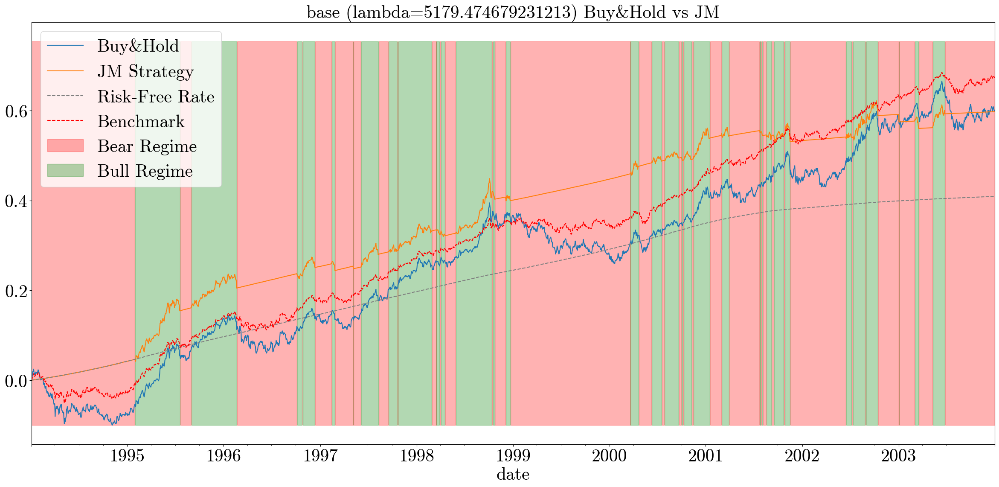

[NS] Best λ = 61054.02296585326, CV Sharpe = 0.846
Classification Report:
               precision    recall  f1-score   support

      growth       0.98      0.75      0.85      1307
       crash       0.80      0.98      0.88      1300

    accuracy                           0.86      2607
   macro avg       0.89      0.86      0.86      2607
weighted avg       0.89      0.86      0.86      2607

   annual_return  annual_vol   sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.018433    0.071401  0.25816     -0.176981  0.406828 -0.016374  0.104151            0.25819
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.013254    0.042679  0.310549     -0.083584  0.449225 -0.012738  0.158569          -0.312292


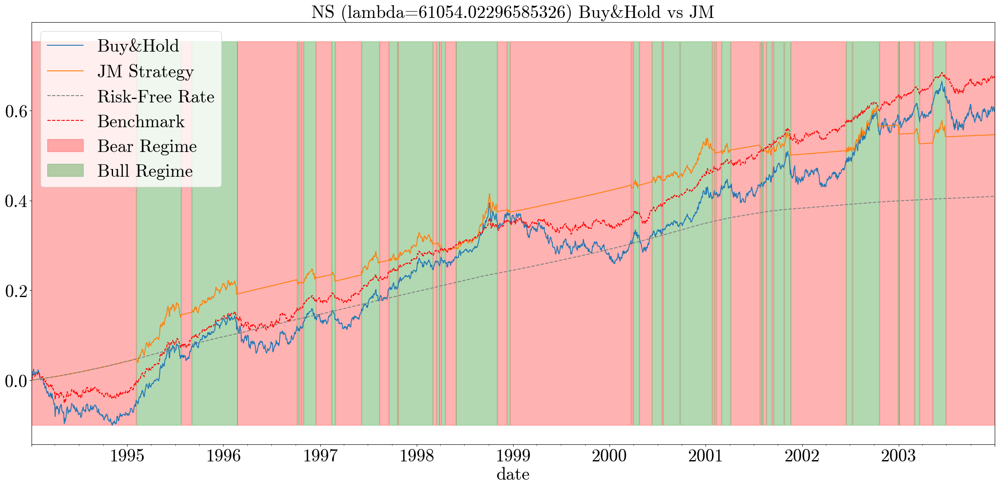

[PCA] Best λ = 8483.428982440717, CV Sharpe = 0.792
Classification Report:
               precision    recall  f1-score   support

      growth       0.98      0.69      0.81      1319
       crash       0.76      0.99      0.86      1288

    accuracy                           0.84      2607
   macro avg       0.87      0.84      0.83      2607
weighted avg       0.87      0.84      0.83      2607

   annual_return  annual_vol   sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.018433    0.071401  0.25816     -0.176981  0.406828 -0.016374  0.104151            0.25819
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.017106    0.041588  0.411321     -0.067014  0.598522 -0.012676  0.255261          -0.215333


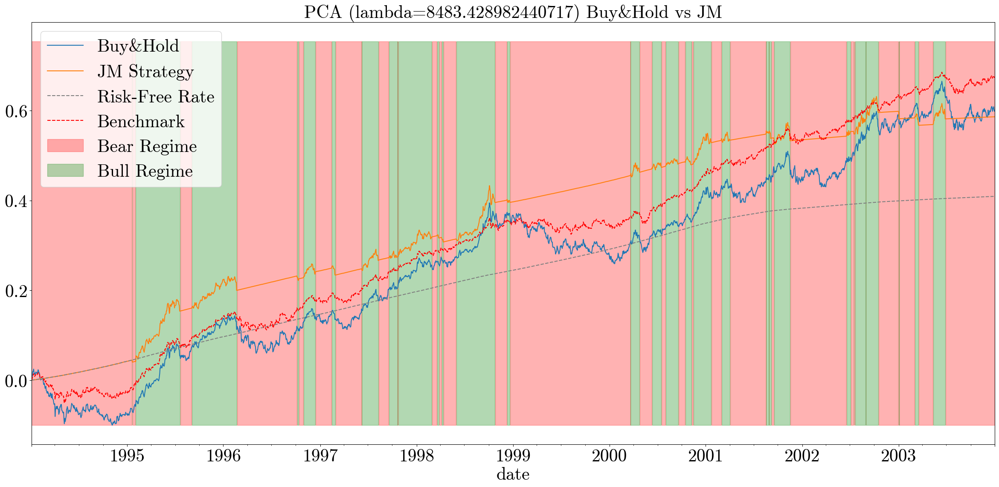

,pred,annual_ret,annual_vol,sharpe,max_drawdown,sortino,cvar_99,calmar,information_ratio
model,,,,,,,,,
base,JM shift,0.018206,0.041892,0.434591,-0.069408,0.638577,-0.012472,0.262301,-0.187796
NS,JM shift,0.013254,0.042679,0.310549,-0.083584,0.449225,-0.012738,0.158569,-0.312292
PCA,JM shift,0.017106,0.041588,0.411321,-0.067014,0.598522,-0.012676,0.255261,-0.215333
Buy&Hold,Buy & Hold,0.018433,0.071401,0.258160,-0.176981,0.406828,-0.016374,0.104151,0.258190


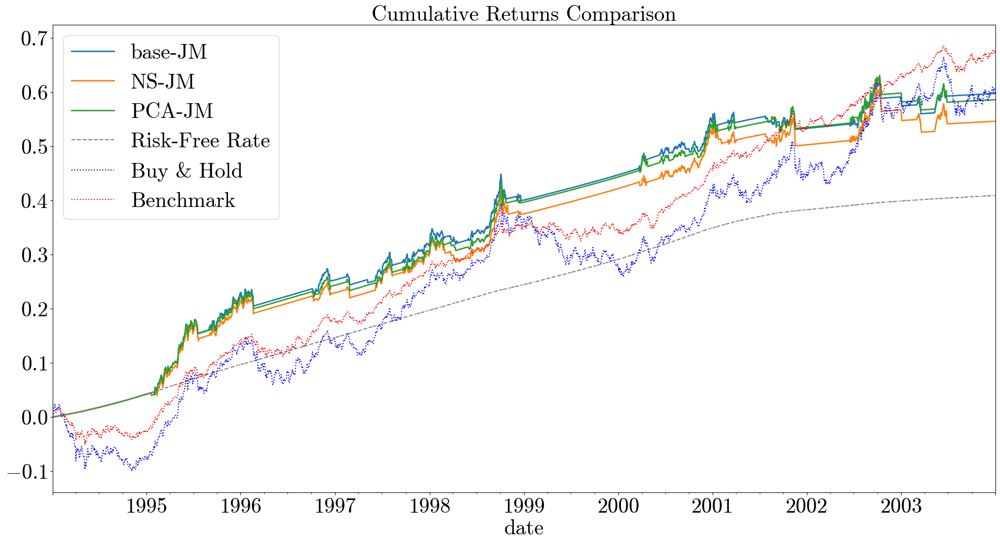

In [44]:
from sklearn.metrics import classification_report

penalty_grid = {
    'base': np.logspace(3.5, 5, 8),
    'NS':   np.logspace(3.5, 5, 8),
    'PCA':  np.logspace(3.5, 5, 8),
}

tscv = TimeSeriesSplit(n_splits=3)

best_penalty   = {}
#online_perf    = {}
perf_bh_dict    = {}
clf_jmonline = []
perf_jm_dict    = {}
results_jmonline = {}

for name in settings:
    X_tr = processed_train[name]

    # --- λ の時系列CV ---
    grid = penalty_grid[name]
    cv_sharpes = []
    for lam in grid:
        fold_sharpes = []
        for train_idx, val_idx in tscv.split(X_tr):
            # --- expand-fit on train fold ---
            X_t, y_t = X_tr.iloc[train_idx], dl.ret_ser.iloc[train_idx]
            jm = JumpModel(**jm_setting, jump_penalty=lam, n_kernel_features = 1000)
            jm.fit(X_t, y_t, sort_by="cumret")

            # --- online inference on validation fold ---
            X_v = X_tr.iloc[val_idx]
            y_v = dl.ret_ser.iloc[val_idx]
            rf_v = rf_test.reindex(X_v.index).fillna(0.0)

            raw = jm.predict_online(X_v)
            labels = pd.Series(raw.values, index=X_v.index).shift(1).dropna()
            regime = 1 - labels

            # align returns & rf to the shifted index
            ret = y_v.reindex(labels.index)
            rf  = rf_v.reindex(labels.index)

            # strategy return: Bull→ret, Bear→rf
            ret_strat = ret.where(regime==1, other=rf)

            # --- excess returns over rf ---
            excess = ret_strat - rf

            # annualized Sharpe of excess
            mu  = excess.mean() * 252
            sd  = ret_strat.std() * np.sqrt(252)
            sharpe = mu/sd if sd>0 else -np.inf
            fold_sharpes.append(sharpe)

        cv_sharpes.append(np.mean(fold_sharpes))

    best_idx     = int(np.argmax(cv_sharpes))
    best_penalty[name] = grid[best_idx]

    # 最適 λ を選択
    idx_star = int(np.argmax(cv_sharpes))
    lam_star = penalty_grid[name][idx_star]
    print(f"[{name}] Best λ = {lam_star}, CV Sharpe = {cv_sharpes[idx_star]:.3f}")

    # --- フル訓練で再フィット & オンライン推論 ---
    jm_best = JumpModel(**jm_setting, jump_penalty=lam_star, n_kernel_features = 1000)
    jm_best.fit(X_tr, dl.ret_ser, sort_by="cumret")
    labels_online_raw = jm_best.predict_online(processed_val[name])

    # online inference 用に時系列でシフト
    idx_pred = processed_val[name].index[1:]
    labels_online = pd.Series(labels_online_raw[:-1].values, index=idx_pred)
    regime_online = 1 - labels_online

    jm_chk = JumpModel(**jm_setting, jump_penalty=lam_star, n_kernel_features = 1000)
    jm_chk.fit(processed_val[name], dl.ret_ser, sort_by="cumret")
    labels_fit = pd.Series(jm_chk.labels_, index=processed_val[name].index)

    # ６．分類レポート
    clf_report = classification_report(labels_fit.loc[idx_pred],labels_online,target_names=["growth","crash"],zero_division=0)
    print("Classification Report:\n", clf_report)
    
    clf_dict = classification_report(labels_fit.loc[idx_pred],labels_online,target_names=["growth","crash"],zero_division=0, output_dict = True)
    n_samples = len(labels_fit.loc[idx_pred])
    for label, metrics in clf_dict.items():
        if isinstance(metrics, dict):
            precision = metrics.get('precision',  0)
            recall    = metrics.get('recall',     0)
            f1_score  = metrics.get('f1-score',   0)
            support   = metrics.get('support',    0)
        else:
            precision = recall = f1_score = metrics
            support   = n_samples
        clf_jmonline.append({
            'pattern': name,
            'label': label,
            'precision': precision,
            'recall': recall,
            'f1_score': f1_score,
            'support': support,
        })

    # テスト期間のリターン・無リスク・ベンチマーク
    y_te    = dl.ret_ser.reindex(idx_pred).dropna()
    rf_te   = rf_test.reindex(idx_pred).fillna(0.0)
    bench_te= bench.reindex(idx_pred).fillna(0.0)

    # Buy&Hold
    ret_bh = y_te
    perf_bh = compute_performance(
        ret_series = ret_bh,
        rf_series  = rf_te,
        freq       = 252,
        benchmark  = rf_te
    )
    perf_bh_dict[name] = perf_bh
    print(perf_bh)

    # JM Strategy
    ret_jm = y_te.where(regime_online==1, other=rf_te)
    perf_jm = compute_performance(
        ret_series = ret_jm,
        rf_series  = rf_te,
        freq       = 252,
        benchmark  = bench_te
    )
    perf_jm_dict[name] = perf_jm
    print(perf_jm)

    # 累積プロット（オリジナル設定を維持）
    cum_bh   = ret_bh.cumsum()
    cum_jm   = ret_jm.cumsum()
    cum_rf   = rf_te.cumsum()
    cum_bench= bench_te.cumsum()

    plt.figure()
    cum_bh.plot(label="Buy&Hold")
    cum_jm.plot(label="JM Strategy")
    cum_rf.plot(label="Risk-Free Rate", linestyle="--", color="gray")
    cum_bench.plot(label="Benchmark",    linestyle="--", color="red")
    ymin = min(cum_bh.min(), cum_jm.min(), cum_rf.min(), cum_bench.min())
    ymax = max(cum_bh.max(), cum_jm.max(), cum_rf.max(), cum_bench.max()) * 1.1

    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime_online==0),
        alpha=0.3, color="red",   label="Bear Regime"
    )
    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime_online==1),
        alpha=0.3, color="green", label="Bull Regime"
    )
    plt.legend(loc="upper left")
    plt.title(f"{name} (lambda={lam_star}) Buy&Hold vs JM")
    plt.tight_layout()
    plt.show()

    results_jmonline[name] = {
        'best_params':         best_penalty[name],
        'best_cv_score':       cv_sharpes[best_idx],
        'classification_report': clf_report,
        'perf_bh':             perf_bh,
        'perf_jm_shift':         perf_jm,
        'cum_bh':              cum_bh,
        'cum_strat':           cum_jm,
    }

    # （プロットはここでも描けますし、後でまとめて描いてもOK）
    plt.close()

pred_index = processed_val['base'].index[1:]
bh = compute_performance(ret_series=dl.ret_ser[pred_index], rf_series=rf_test, freq=252, benchmark=rf_test)
cum_bh= dl.ret_ser[pred_index].cumsum()

results_jmonline['Buy&Hold'] = {
    'best_params': None,
    'best_cv_score':   None,
    'classification_report': None,
    'perf_bh':     bh,
    'perf_jm_shift':None,
    'cum_bh':      cum_bh,
    'cum_strat':   None
}

perf_table = []
for name, res in results_jmonline.items():
    jm = res.get('perf_jm_shift')
    bh = res['perf_bh']
    if jm is None:
        perf_table.append({
            'pred':      'Buy & Hold',
            'model':     name,
            'annual_ret':   bh['annual_return'],
            'annual_vol':   bh['annual_vol'],
            'sharpe':       bh['sharpe'],
            'max_drawdown': bh['max_drawdown'],
            'sortino':      bh['sortino'],
            'cvar_99':      bh['cvar_99'],
            'calmar':       bh['calmar'],
            'information_ratio': bh['information_ratio'],
        })
    if jm is not None:
        perf_table.append({
            'pred':      'JM shift',
            'model':     name,
            'annual_ret':   jm['annual_return'],
            'annual_vol':   jm['annual_vol'],
            'sharpe':       jm['sharpe'],
            'max_drawdown': jm['max_drawdown'],
            'sortino':      jm['sortino'],
            'cvar_99':      jm['cvar_99'],
            'calmar':       jm['calmar'],
            'information_ratio': jm['information_ratio'],
        })
perf_df = pd.DataFrame(perf_table).set_index('model')
perf_df = perf_df.map(lambda x: x.item() if isinstance(x, pd.Series) else x)
display(perf_df)

# 4) 累積リターンプロット
plt.figure()
for name, res in results_jmonline.items():
    if res['cum_strat'] is not None:
        res['cum_strat'].plot(label=f"{name}-JM", linewidth=2)
rf_test[pred_index].cumsum().plot(label="Risk-Free Rate", linestyle='--', color='gray')
cum_bh.plot(label="Buy & Hold", linestyle=':', color='blue')
first = next(iter(results_jmonline.values()))
bench.reindex(first['cum_bh'].index).fillna(0).cumsum() \
     .plot(label="Benchmark", linestyle=':', color='red')

plt.legend()
plt.title("Cumulative Returns Comparison")
plt.show()

Prediction period: 1994-01-01 00:00:00 to 1994-06-30 00:00:00
Best jump penalty: 61054.02296585326, Best reg_alpha: 0.1, Best Sharpe: 1.374
Feature importances:
 sortino_20           0.782211
DD-log_60            0.084758
sortino_60           0.027861
ret_60               0.022280
DD-log_20            0.020994
vix_logdiff_ewm      0.013507
slope_diff_ewm       0.012811
ret_5                0.006859
y2_diff_ewm          0.005684
move_logdiff_ewma    0.005454
y10_diff_ewm         0.005289
DD-log_5             0.004167
ret_20               0.003788
vol_diff_ewma        0.002749
sortino_5            0.001588
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.00      0.00      0.00        35
       crash       0.73      1.00      0.84        93

    accuracy                           0.73       128
   macro avg       0.36      0.50      0.42       128
weighted avg     

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/2100859970.py:100: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  regime_all = pd.concat([regime_all, regime])


Prediction period: 1994-07-01 00:00:00 to 1994-12-31 00:00:00
Best jump penalty: 22758.459260747863, Best reg_alpha: 0.1, Best Sharpe: 1.258
Feature importances:
 sortino_20           0.753930
DD-log_60            0.065791
sortino_60           0.048842
DD-log_20            0.042157
ret_60               0.029902
y10_diff_ewm         0.010868
slope_diff_ewm       0.009477
vix_logdiff_ewm      0.008281
y2_diff_ewm          0.005886
ret_5                0.005384
DD-log_5             0.005234
move_logdiff_ewma    0.005023
ret_20               0.004814
vol_diff_ewma        0.002211
sortino_5            0.002200
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.00      0.00      0.00        67
       crash       0.48      1.00      0.65        63

    accuracy                           0.48       130
   macro avg       0.24      0.50      0.33       130
weighted avg    

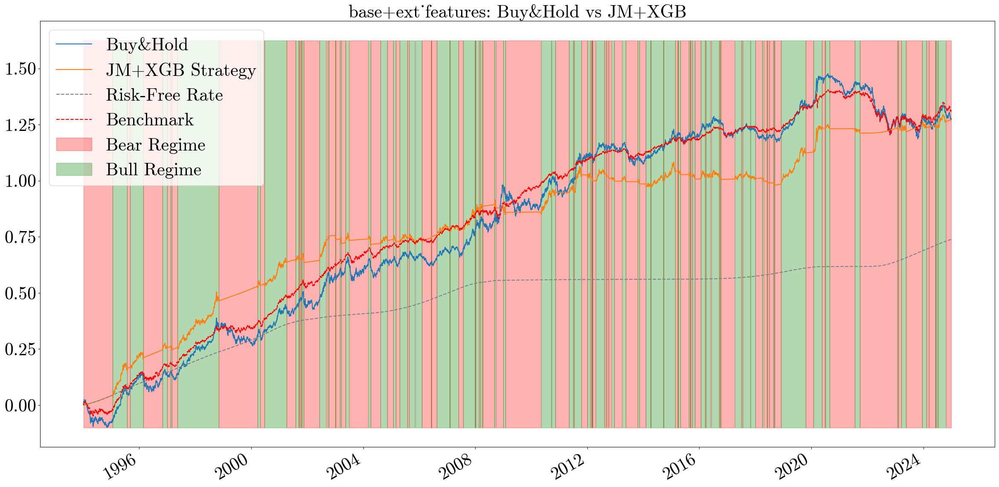

Prediction period: 1994-01-01 00:00:00 to 1994-06-30 00:00:00
Best jump penalty: 22758.459260747863, Best reg_alpha: 0.1, Best Sharpe: 1.277
Feature importances:
 sortino_20            0.757759
sortino_60            0.128241
curv_diff_ewma_63     0.017480
DD-log_20             0.014017
DD-log_60             0.011866
vix_logdiff_ewm       0.008731
DD-log_5              0.008661
y2_diff_ewm           0.006900
y10_diff_ewm          0.006446
ret_20                0.006151
slope_diff_ewma_63    0.006131
ret_60                0.005178
move_logdiff_ewma     0.004140
level_diff_ewma_63    0.003887
ret_5                 0.003140
curv_diff_ewma_5      0.002950
slope_diff_ewma_5     0.002841
sortino_5             0.002178
vol_diff_ewma         0.001805
level_diff_ewma_5     0.001496
bi5_logdiff_ewma      0.000000
bi10_logdiff_ewma     0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.00      0.00      0.00        37
       

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/2100859970.py:100: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  regime_all = pd.concat([regime_all, regime])


Prediction period: 1994-07-01 00:00:00 to 1994-12-31 00:00:00
Best jump penalty: 22758.459260747863, Best reg_alpha: 0.1, Best Sharpe: 1.379
Feature importances:
 sortino_20            0.725654
sortino_60            0.151034
DD-log_20             0.029033
DD-log_60             0.023558
vix_logdiff_ewm       0.008997
y10_diff_ewm          0.008687
curv_diff_ewma_63     0.008646
slope_diff_ewma_63    0.006580
ret_5                 0.004913
ret_60                0.004666
level_diff_ewma_63    0.004443
curv_diff_ewma_5      0.004218
DD-log_5              0.004140
y2_diff_ewm           0.002933
ret_20                0.002747
slope_diff_ewma_5     0.002631
move_logdiff_ewma     0.001930
level_diff_ewma_5     0.001927
sortino_5             0.001743
vol_diff_ewma         0.001521
bi5_logdiff_ewma      0.000000
bi10_logdiff_ewma     0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.00      0.00      0.00        29
       

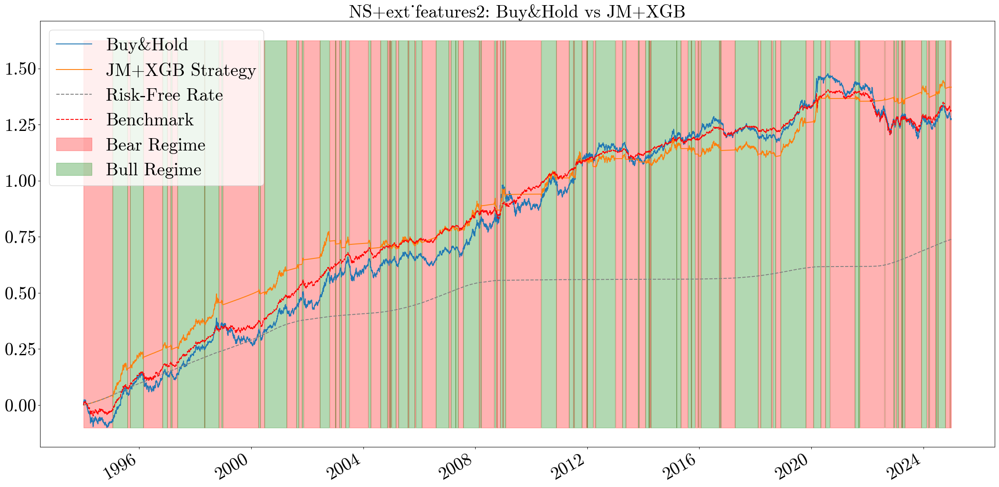

Prediction period: 1994-01-01 00:00:00 to 1994-06-30 00:00:00
Best jump penalty: 37275.93720314938, Best reg_alpha: 0.1, Best Sharpe: 1.374
Feature importances:
 sortino_20           0.781981
DD-log_60            0.067108
sortino_60           0.033077
ret_60               0.022948
PC1_diff_ewma_63     0.019483
vix_logdiff_ewm      0.013277
DD-log_20            0.008925
y10_diff_ewm         0.007054
ret_5                0.006526
ret_20               0.005693
y2_diff_ewm          0.004274
PC3_diff_ewma_63     0.004258
PC1_diff_ewma_5      0.003622
move_logdiff_ewma    0.003619
PC2_diff_ewma_63     0.003396
PC2_diff_ewma_5      0.002898
PC4_diff_ewma_63     0.002364
DD-log_5             0.002168
PC3_diff_ewma_5      0.001692
vol_diff_ewma        0.001594
sortino_5            0.001574
PC4_diff_ewma_5      0.001226
PC5_diff_ewma_63     0.000678
PC5_diff_ewma_5      0.000565
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               preci

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/2100859970.py:100: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  regime_all = pd.concat([regime_all, regime])


Prediction period: 1994-07-01 00:00:00 to 1994-12-31 00:00:00
Best jump penalty: 61054.02296585326, Best reg_alpha: 0.1, Best Sharpe: 1.314
Feature importances:
 sortino_20           0.739462
DD-log_60            0.090224
sortino_60           0.053788
ret_60               0.030206
y10_diff_ewm         0.010634
PC1_diff_ewma_63     0.010579
ret_20               0.008986
DD-log_20            0.008735
vix_logdiff_ewm      0.006962
ret_5                0.006498
DD-log_5             0.005910
y2_diff_ewm          0.004974
PC1_diff_ewma_5      0.003671
move_logdiff_ewma    0.003388
PC4_diff_ewma_63     0.002821
PC2_diff_ewma_63     0.002439
PC2_diff_ewma_5      0.002167
PC3_diff_ewma_63     0.002000
PC3_diff_ewma_5      0.001933
vol_diff_ewma        0.001314
sortino_5            0.001304
PC5_diff_ewma_63     0.000750
PC4_diff_ewma_5      0.000694
PC5_diff_ewma_5      0.000562
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               preci

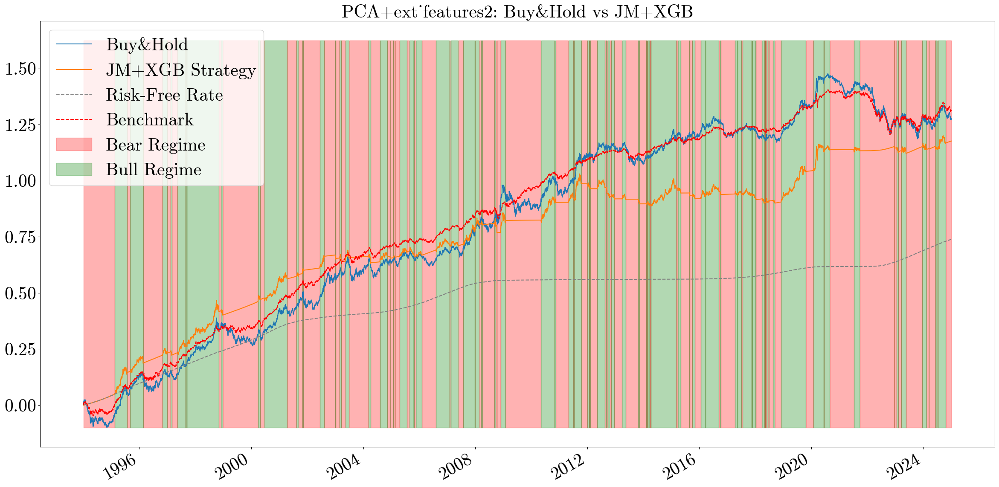

Prediction period: 1994-01-01 00:00:00 to 1994-06-30 00:00:00
Best jump penalty: 61054.02296585326, Best reg_alpha: 0.1, Best Sharpe: 1.420
Feature importances:
 sortino_20            0.768775
DD-log_60             0.081637
sortino_60            0.028248
DD-log_20             0.026127
ret_60                0.023557
curv_diff_ewma_63     0.010684
vix_logdiff_ewm       0.009804
ret_5                 0.006438
slope_diff_ewma_63    0.005295
curv_diff_ewma_5      0.005031
level_diff_ewma_63    0.004872
move_logdiff_ewma     0.004518
y10_diff_ewm          0.004125
slope_diff_ewma_5     0.003580
DD-log_5              0.003544
y2_diff_ewm           0.003460
ret_20                0.003440
vol_diff_ewma         0.003327
level_diff_ewma_5     0.002454
sortino_5             0.001084
bi5_logdiff_ewma      0.000000
bi10_logdiff_ewma     0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.00      0.00      0.00        35
       c

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/2100859970.py:100: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  regime_all = pd.concat([regime_all, regime])


Prediction period: 1994-07-01 00:00:00 to 1994-12-31 00:00:00
Best jump penalty: 22758.459260747863, Best reg_alpha: 0.1, Best Sharpe: 1.295
Feature importances:
 sortino_20            0.755147
DD-log_60             0.066292
sortino_60            0.057635
DD-log_20             0.035280
ret_60                0.025634
vix_logdiff_ewm       0.007201
y10_diff_ewm          0.006752
curv_diff_ewma_63     0.005708
ret_20                0.005670
move_logdiff_ewma     0.005100
y2_diff_ewm           0.004847
curv_diff_ewma_5      0.004598
ret_5                 0.004352
DD-log_5              0.004112
level_diff_ewma_63    0.003334
slope_diff_ewma_63    0.002816
vol_diff_ewma         0.001642
level_diff_ewma_5     0.001592
slope_diff_ewma_5     0.001497
sortino_5             0.000788
bi5_logdiff_ewma      0.000000
bi10_logdiff_ewma     0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.00      0.00      0.00        67
       

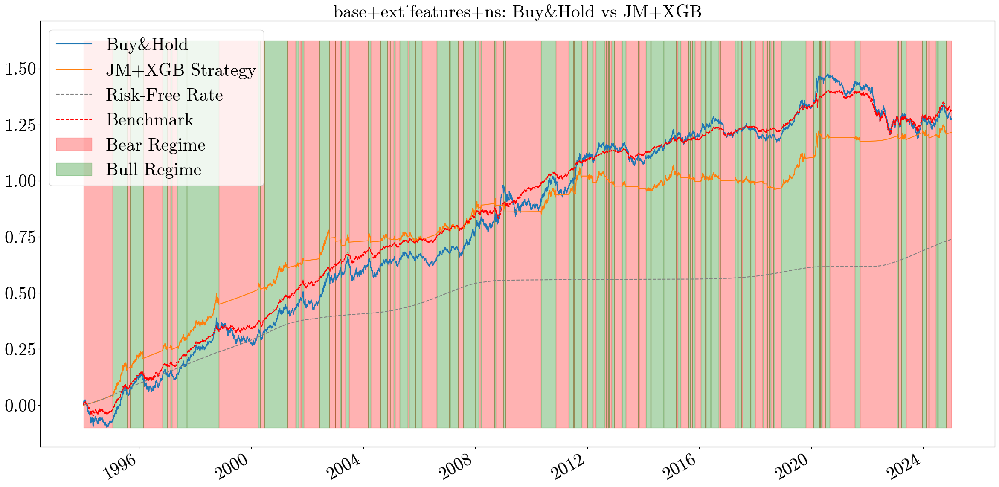

Prediction period: 1994-01-01 00:00:00 to 1994-06-30 00:00:00
Best jump penalty: 37275.93720314938, Best reg_alpha: 0.1, Best Sharpe: 1.402
Feature importances:
 sortino_20           0.757495
DD-log_60            0.073272
sortino_60           0.045058
ret_60               0.026948
DD-log_20            0.025823
PC1_diff_ewma_63     0.009601
y10_diff_ewm         0.007279
vix_logdiff_ewm      0.006450
ret_5                0.005815
DD-log_5             0.005108
ret_20               0.004889
y2_diff_ewm          0.004472
PC1_diff_ewma_5      0.004307
PC4_diff_ewma_63     0.003356
move_logdiff_ewma    0.003341
PC3_diff_ewma_63     0.002786
PC2_diff_ewma_5      0.002719
PC2_diff_ewma_63     0.001949
PC3_diff_ewma_5      0.001868
PC5_diff_ewma_5      0.001851
vol_diff_ewma        0.001620
sortino_5            0.001552
PC4_diff_ewma_5      0.001321
PC5_diff_ewma_63     0.001120
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               preci

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/2100859970.py:100: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  regime_all = pd.concat([regime_all, regime])


Prediction period: 1994-07-01 00:00:00 to 1994-12-31 00:00:00
Best jump penalty: 22758.459260747863, Best reg_alpha: 0.1, Best Sharpe: 1.295
Feature importances:
 sortino_20           0.754953
DD-log_60            0.060643
sortino_60           0.049708
DD-log_20            0.037456
ret_60               0.032334
y10_diff_ewm         0.008837
vix_logdiff_ewm      0.007673
y2_diff_ewm          0.004975
move_logdiff_ewma    0.004650
ret_5                0.004597
PC1_diff_ewma_63     0.004240
PC1_diff_ewma_5      0.004194
DD-log_5             0.004100
ret_20               0.003325
PC4_diff_ewma_63     0.003312
PC3_diff_ewma_63     0.003089
PC2_diff_ewma_63     0.002743
vol_diff_ewma        0.002006
PC2_diff_ewma_5      0.001827
sortino_5            0.001581
PC4_diff_ewma_5      0.001323
PC3_diff_ewma_5      0.001187
PC5_diff_ewma_63     0.000625
PC5_diff_ewma_5      0.000618
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               prec

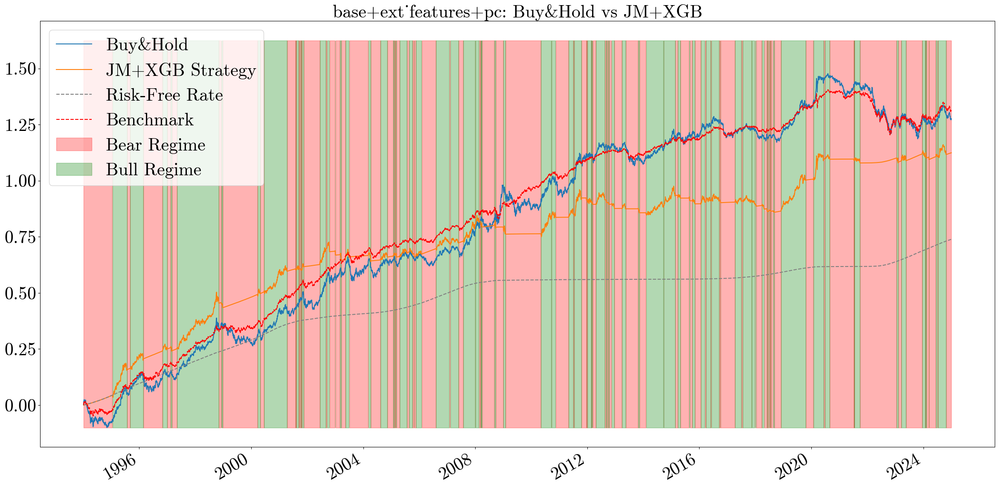

,pred,annual_ret,annual_vol,sharpe,max_drawdown,sortino,cvar_99,calmar,information_ratio
model,,,,,,,,,
base+ext_features,XGB_roll,0.016737,0.045333,0.369207,-0.121824,0.559462,-0.012281,0.137388,-0.030181
NS+ext_features2,XGB_roll,0.021300,0.047943,0.444279,-0.121337,0.683171,-0.012576,0.175546,0.079288
PCA+ext_features2,XGB_roll,0.013755,0.045738,0.300747,-0.145825,0.454849,-0.012294,0.094328,-0.101627
base+ext_features+ns,XGB_roll,0.014970,0.045677,0.327748,-0.125865,0.494399,-0.012358,0.118940,-0.072433
base+ext_features+pc,XGB_roll,0.012113,0.045733,0.264861,-0.132217,0.397682,-0.012378,0.091614,-0.141091


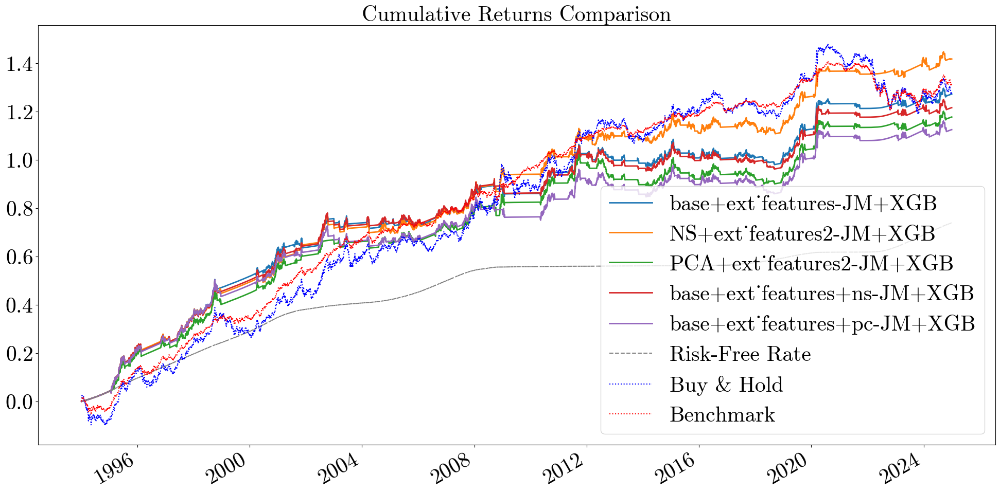

In [45]:
from datetime import timedelta
from dateutil.relativedelta import relativedelta
from xgboost import XGBRegressor
from sklearn.metrics import classification_report

lambda_list = np.logspace(3.5, 5 ,8)
reg_alpha_list = [0.0] + np.logspace(-1, 1.3, 4)

train_years = 11
pred_months = 6
val_start = pd.Timestamp(valstart)
val_end = pd.Timestamp(dataend)

clf_xgb_roll = []
results_xgb_roll = {}
perf_jm_xgb_dict_roll = {}
regime_all = []


patterns = {
    'base+ext_features'       : ('base', ext_features_pre),
    'NS+ext_features2'        : ('NS',   ext_features_pre2),
    'PCA+ext_features2'       : ('PCA',  ext_features_pre2),
    'base+ext_features+ns'    : ('base', ext_features_pre_with_ns),
    'base+ext_features+pc'    : ('base', ext_features_pre_with_pc),
}

for pname, (umodel, ext_features_df) in patterns.items():
    X_all      = pd.concat([processed_train[umodel],processed_val[umodel],processed_test[umodel]],axis = 0, ignore_index = False)
    ret_all    = dl.ret_ser
    rf_all     = rf_test
    regime_all = pd.Series(dtype=int)
    jm_labels = pd.Series(dtype=int)

    t0 = val_start
    while t0 + relativedelta(months=pred_months) <= val_end:
        train_start = t0 - relativedelta(years=train_years)
        train_end   = t0 - timedelta(days=1)
        pred_start  = t0
        pred_end    = t0 + relativedelta(months=pred_months) - timedelta(days=1)

        Xj_train = X_all.loc[train_start:train_end]
        idx_train = Xj_train.index[:-1]

        best_sharpe = -np.inf
        best_lambda = None
        best_alpha = None
        best_model = None

        for lam in lambda_list:
            jm = JumpModel(**jm_setting, jump_penalty=lam, n_kernel_features = 1000)
            jm.fit(Xj_train, ret_all.loc[train_start:train_end], sort_by = "cumret")
            proba_jm = jm.proba_
            y_train = pd.Series(proba_jm.iloc[1:,1].values, index = idx_train)
            #y_train.to_csv("y_train.csv")
            X_feat_tr = pd.concat([Xj_train.loc[idx_train], ext_features_df.reindex(idx_train)], axis = 1)
            X_feat_tr = X_feat_tr.dropna(axis=0, how='all')
            #X_feat_tr.to_csv("X_feat_tr.csv")
            
    
            for alpha in reg_alpha_list:
                xgb = XGBRegressor(objective = "reg:squarederror", random_state = 42, reg_alpha = alpha)
                xgb.fit(X_feat_tr.values, y_train.values)

                idx_sh = X_feat_tr.index[1:]
                p_tr = xgb.predict(X_feat_tr.values)
                smooth = pd.Series(p_tr, index = X_feat_tr.index,).ewm(halflife = 4, adjust = False).mean()
                y_pred = (smooth>0.5).astype(int)
                y_pred = pd.Series(y_pred[:-1].values, index = idx_sh)
                regime = 1 - y_pred

                ret_tr = ret_all.reindex(idx_sh)
                rf_tr = rf_all.reindex(idx_sh)
                strat = ret_tr.where(regime ==1, other = rf_tr)
                excess = strat - rf_tr
                mu = excess.mean() * 252
                sd = strat.std() * np.sqrt(252)
                sharpe = mu /sd if sd>0 else -np.inf

                if sharpe > best_sharpe:
                    best_sharpe = sharpe
                    best_lambda = lam
                    best_alpha = alpha
                    best_model = xgb
        print(f"Prediction period: {pred_start} to {pred_end}")
        print(f"Best jump penalty: {best_lambda}, Best reg_alpha: {best_alpha}, Best Sharpe: {best_sharpe:.3f}")
        importances = pd.Series(best_model.feature_importances_, index=X_feat_tr.columns)
        print("Feature importances:\n", importances.sort_values(ascending=False))


        Xj_pred = X_all.loc[pred_start:pred_end]
        X_feat_val = pd.concat([Xj_pred, ext_features_df.reindex(Xj_pred.index)], axis=1)
        X_feat_val = X_feat_val.dropna(axis=1, how='all')
        pred_idx  = X_feat_val.index[1:]
        p_xgb = best_model.predict(X_feat_val.values)
        smooth = pd.Series(p_xgb, index=X_feat_val.index).ewm(halflife=4, adjust=False).mean()
        y_pred = (smooth > 0.5).astype(int)
        y_pred = pd.Series(y_pred[:-1].values, index=pred_idx)
        regime     = 1 - y_pred
        regime_all = pd.concat([regime_all, regime])

        n_samples = Xj_pred.shape[0]
        n_kernel_features = min(500, n_samples // 2)
        jm_final = JumpModel(**jm_setting, jump_penalty = best_lambda, n_kernel_features = n_kernel_features)
        jm_final.fit(Xj_pred, ret_all, sort_by = "cumret")

        jm_true = pd.Series(jm_final.labels_, index = Xj_pred.index)
        #jm_true.loc[pred_idx].to_csv("jm_true.csv")
        #y_pred.to_csv("y_pred.csv")
        clf_report = classification_report(jm_true.loc[pred_idx],y_pred,target_names=["growth","crash"],labels = [0,1],zero_division=0)
        print("Classification Report:\n", clf_report)
    
        clf_dict = classification_report(jm_true.loc[pred_idx],y_pred.loc[jm_true[1:].index],target_names=["growth","crash"],labels = [0,1],zero_division=0, output_dict = True)
        n_samples = len(jm_true.loc[pred_idx])
        for label, metrics in clf_dict.items():
            if isinstance(metrics, dict):
                precision = metrics.get('precision',  0)
                recall    = metrics.get('recall',     0)
                f1_score  = metrics.get('f1-score',   0)
                support   = metrics.get('support',    0)
            else:
                precision = recall = f1_score = metrics
                support   = n_samples
            clf_xgb_roll.append({'pattern': pname,'label': label,'precision': precision,'recall': recall,'f1_score': f1_score,'support': support,})
        
        t0 += relativedelta(months = pred_months)
    
    pred_idx = regime_all.index    
    ret_val   = ret_ser.reindex(pred_idx).dropna()
    rf_aligned = rf_test.reindex(pred_idx).fillna(0.0)
    ret_strat  = ret_val.where(regime_all==1, other=rf_aligned)
    perf_jm_xgb = compute_performance(
        ret_series=ret_strat,
        rf_series =rf_aligned,
        freq=252,
        benchmark=bench.reindex(pred_idx).fillna(0.0)
    )
    perf_jm_xgb_dict_roll[name] = perf_jm_xgb
    print(perf_jm_xgb)

    perf_bh = compute_performance(
        ret_series = ret_val,
        rf_series  = rf_aligned,
        freq       = 252,
        benchmark  = bench.reindex(pred_idx).fillna(0.0)
    )
    print(perf_bh)

    perf_bench = compute_performance(
        ret_series = bench.reindex(pred_idx).fillna(0.0),
        rf_series  = rf_aligned,
        freq       = 252,
        benchmark  = bench.reindex(pred_idx).fillna(0.0)
    )
    print(perf_bench)

    cum_bh    = ret_val.cumsum()
    cum_jm_xgb= ret_strat.cumsum()
    cum_rf    = rf_aligned.cumsum()
    cum_bench = bench.reindex(pred_idx).fillna(0.0).cumsum()

    plt.figure()
    cum_bh.plot(label="Buy&Hold")
    cum_jm_xgb.plot(label="JM+XGB Strategy")
    cum_rf.plot(label="Risk-Free Rate", linestyle="--", color="gray")
    cum_bench.plot(label="Benchmark", linestyle="--", color="red")

    ymin = min(cum_bh.min(), cum_jm_xgb.min(), cum_rf.min(), cum_bench.min())
    ymax = max(cum_bh.max(), cum_jm_xgb.max(), cum_rf.max(), cum_bench.max()) * 1.1

    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime_all==0), alpha=0.3, color="red",   label="Bear Regime"
    )
    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime_all==1), alpha=0.3, color="green", label="Bull Regime"
    )

    plt.legend(loc="upper left")
    plt.title(f"{pname}: Buy&Hold vs JM+XGB")
    plt.tight_layout()
    plt.show()

    # ９．結果格納
    results_xgb_roll[pname] = {
        'best_params':         best_lambda,
        'best_cv_score':       best_sharpe,
        'classification_report': clf_report,
        'perf_bh':             perf_bh,
        'perf_jm_xgb':         perf_jm_xgb,
        'cum_bh':              cum_bh,
        'cum_strat':           cum_jm_xgb,
        'figure':              plt.gcf()
    }

    plt.close()

perf_table = []
for name, res in results_xgb_roll.items():
    row = {
        'pred':        "XGB_roll",
        'model':       name,
        'annual_ret':res['perf_jm_xgb']['annual_return'],
        'annual_vol':res['perf_jm_xgb']['annual_vol'],
        'sharpe':    res['perf_jm_xgb']['sharpe'],
        'max_drawdown': res['perf_jm_xgb']['max_drawdown'],
        'sortino':   res['perf_jm_xgb']['sortino'],
        'cvar_99':   res['perf_jm_xgb']['cvar_99'],
        'calmar':    res['perf_jm_xgb']['calmar'],
        'information_ratio': res['perf_jm_xgb']['information_ratio'],
    }
    perf_table.append(row)
perf_df = pd.DataFrame(perf_table).set_index('model')
perf_df = perf_df.map(lambda cell: cell.item() if isinstance(cell, pd.Series) and cell.size == 1 else cell)
display(perf_df)

plt.figure()
for name, res in results_xgb_roll.items():
    res['cum_strat'].plot(label=f"{name}-JM+XGB", linewidth=2)
rf_test[pred_idx].cumsum().plot(label="Risk-Free Rate", linestyle='--', color='gray')
cum_bh.plot(label="Buy & Hold", linestyle=':', color='blue')
first = next(iter(results_xgb_roll.values()))
bench.reindex(first['cum_bh'].index).fillna(0).cumsum().plot(label="Benchmark", linestyle=':', color='red')

plt.legend()
plt.title("Cumulative Returns Comparison")
plt.show()

In [46]:
perf_bh = compute_performance(
    ret_series = ret_val,
    rf_series  = rf_aligned,
    freq       = 252,
    benchmark  = bench.reindex(pred_idx).fillna(0.0)
)
print(perf_bh)

perf_bench = compute_performance(
    ret_series = bench.reindex(pred_idx).fillna(0.0),
    rf_series  = rf_aligned,
    freq       = 252,
    benchmark  = bench.reindex(pred_idx).fillna(0.0)
)
print(perf_bench)

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.016847    0.073906  0.227956     -0.296955  0.373668 -0.015808  0.056734           -0.02985
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0        0.01799    0.041383  0.434709     -0.221517  0.700062 -0.009376  0.081211                NaN


[base+ext_features] Best λ=61054.02296585326, Score=0.069, Alpha=1.000
Feature importances:
 sortino_20           0.862230
ret_20               0.026147
ret_5                0.018535
sortino_60           0.013536
DD-log_20            0.013020
DD-log_60            0.010645
slope_diff_ewm       0.010073
vix_logdiff_ewm      0.007586
move_logdiff_ewma    0.007266
sortino_5            0.006764
y2_diff_ewm          0.006408
y10_diff_ewm         0.005626
ret_60               0.004796
vol_diff_ewma        0.003873
DD-log_5             0.003493
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.94      0.85      0.89      1259
       crash       0.87      0.95      0.91      1348

    accuracy                           0.90      2607
   macro avg       0.90      0.90      0.90      2607
weighted avg       0.90      0.90      0.90      2607

   annual_return  annual_vol   

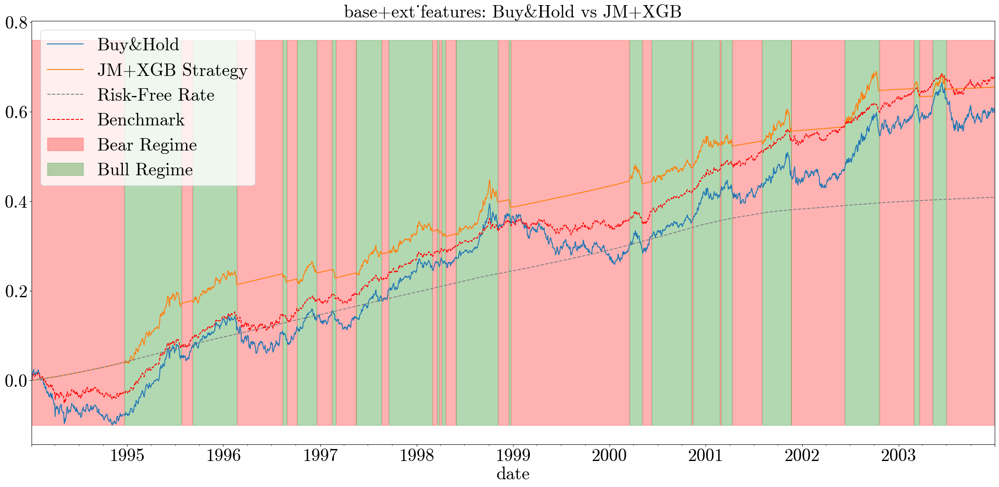

[NS+ext_features2] Best λ=61054.02296585326, Score=0.070, Alpha=1.000
Feature importances:
 ret_20                0.446914
sortino_20            0.421065
ret_60                0.025079
vix_logdiff_ewm       0.014853
sortino_5             0.009951
DD-log_60             0.009308
slope_diff_ewma_63    0.008564
curv_diff_ewma_63     0.008353
sortino_60            0.007412
ret_5                 0.007339
move_logdiff_ewma     0.007310
y2_diff_ewm           0.007218
DD-log_20             0.004881
curv_diff_ewma_5      0.004099
vol_diff_ewma         0.004090
level_diff_ewma_63    0.003420
slope_diff_ewma_5     0.003300
level_diff_ewma_5     0.002773
y10_diff_ewm          0.002714
DD-log_5              0.001356
bi5_logdiff_ewma      0.000000
bi10_logdiff_ewma     0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.94      0.81      0.87      1307
       crash       0.83      0.95      0.89      1300

    accuracy           

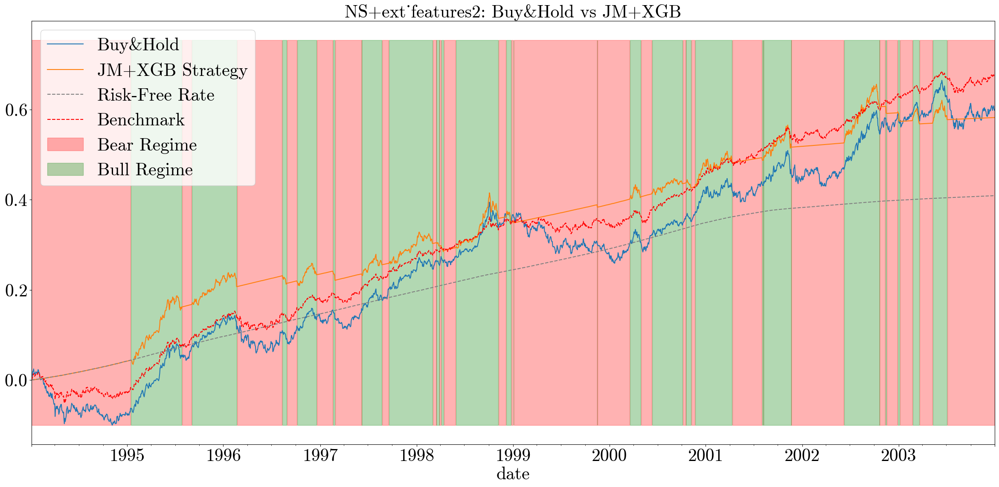

[PCA+ext_features2] Best λ=100000.0, Score=0.071, Alpha=1.000
Feature importances:
 sortino_20           0.812125
ret_60               0.040364
y2_diff_ewm          0.025855
sortino_5            0.019103
PC2_diff_ewma_63     0.011195
ret_5                0.009999
DD-log_20            0.009462
PC1_diff_ewma_5      0.008958
DD-log_60            0.008598
PC1_diff_ewma_63     0.006418
sortino_60           0.006409
vix_logdiff_ewm      0.006258
PC3_diff_ewma_63     0.004833
vol_diff_ewma        0.004485
PC2_diff_ewma_5      0.003922
DD-log_5             0.003796
move_logdiff_ewma    0.003706
PC4_diff_ewma_5      0.003143
ret_20               0.002504
PC4_diff_ewma_63     0.002139
y10_diff_ewm         0.001988
PC3_diff_ewma_5      0.001780
PC5_diff_ewma_5      0.001604
PC5_diff_ewma_63     0.001355
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.96      0.73      0.8

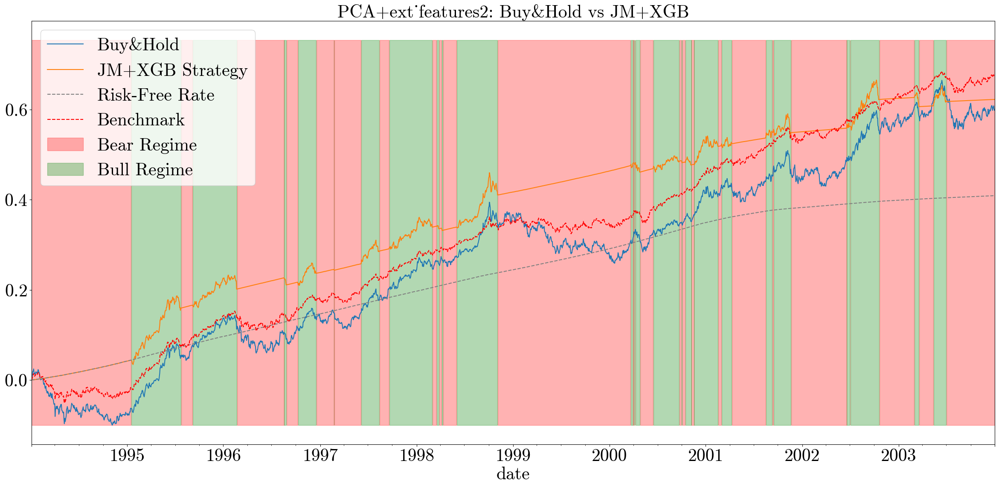

[base+ext_features2+ns] Best λ=22758.459260747863, Score=0.070, Alpha=1.000
Feature importances:
 sortino_20            0.826938
ret_20                0.080131
DD-log_20             0.009892
curv_diff_ewma_63     0.008634
slope_diff_ewma_63    0.008096
ret_60                0.007818
DD-log_60             0.007349
vix_logdiff_ewm       0.006500
sortino_60            0.006321
ret_5                 0.004615
y2_diff_ewm           0.004583
move_logdiff_ewma     0.004573
level_diff_ewma_5     0.003660
y10_diff_ewm          0.003559
sortino_5             0.003536
level_diff_ewma_63    0.003074
DD-log_5              0.003029
slope_diff_ewma_5     0.002992
curv_diff_ewma_5      0.002604
vol_diff_ewma         0.002097
bi5_logdiff_ewma      0.000000
bi10_logdiff_ewma     0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.94      0.86      0.90      1263
       crash       0.88      0.95      0.91      1344

    accuracy     

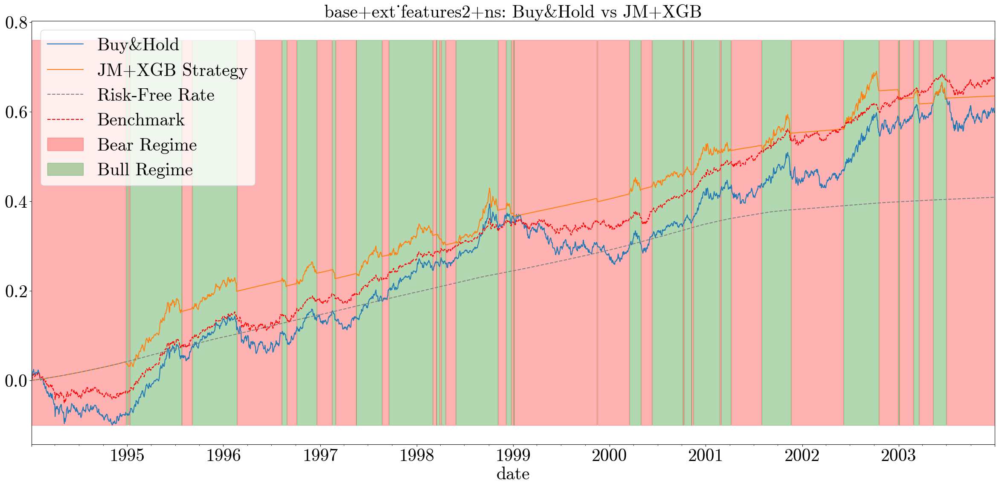

[base+ext_features2+pc] Best λ=61054.02296585326, Score=0.071, Alpha=1.000
Feature importances:
 sortino_20           0.842928
ret_20               0.031449
DD-log_60            0.011783
sortino_5            0.011248
ret_60               0.010020
sortino_60           0.009045
PC3_diff_ewma_5      0.008976
PC2_diff_ewma_63     0.008475
ret_5                0.007571
DD-log_20            0.007533
PC1_diff_ewma_63     0.007265
vix_logdiff_ewm      0.006264
y2_diff_ewm          0.005879
move_logdiff_ewma    0.005067
PC1_diff_ewma_5      0.004995
y10_diff_ewm         0.004711
PC2_diff_ewma_5      0.004342
PC4_diff_ewma_5      0.002609
DD-log_5             0.002402
vol_diff_ewma        0.002390
PC3_diff_ewma_63     0.001869
PC4_diff_ewma_63     0.001190
PC5_diff_ewma_5      0.001173
PC5_diff_ewma_63     0.000816
bi5_logdiff_ewma     0.000000
bi10_logdiff_ewma    0.000000
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.96      

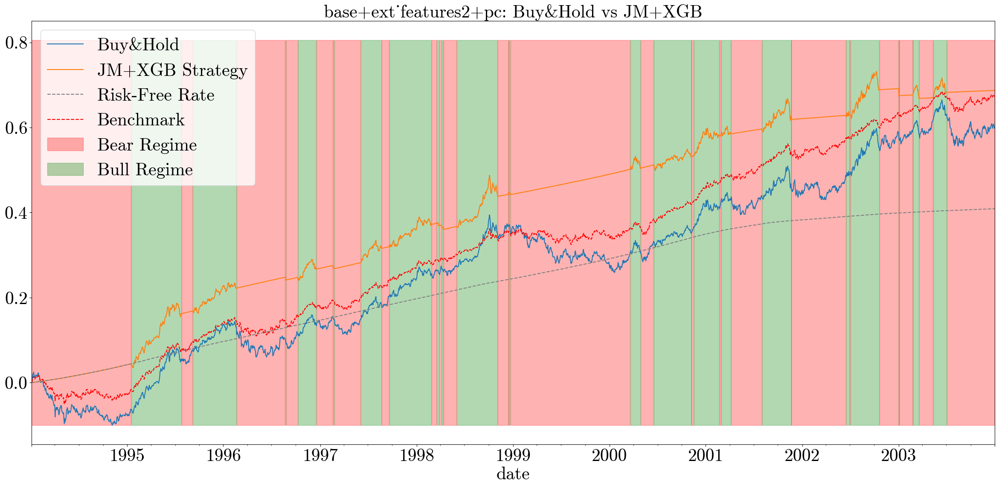

,pred,annual_ret,annual_vol,sharpe,max_drawdown,sortino,cvar_99,calmar,information_ratio
model,,,,,,,,,
base+ext_features,XGB_roll,0.016737,0.045333,0.369207,-0.121824,0.559462,-0.012281,0.137388,-0.030181
NS+ext_features2,XGB_roll,0.021300,0.047943,0.444279,-0.121337,0.683171,-0.012576,0.175546,0.079288
PCA+ext_features2,XGB_roll,0.013755,0.045738,0.300747,-0.145825,0.454849,-0.012294,0.094328,-0.101627
base+ext_features+ns,XGB_roll,0.014970,0.045677,0.327748,-0.125865,0.494399,-0.012358,0.118940,-0.072433
base+ext_features+pc,XGB_roll,0.012113,0.045733,0.264861,-0.132217,0.397682,-0.012378,0.091614,-0.141091
base+ext_features,XGB,0.023750,0.045319,0.524074,-0.085305,0.786831,-0.012554,0.278418,-0.048471
NS+ext_features2,XGB,0.016751,0.045912,0.364850,-0.090553,0.537557,-0.012959,0.184984,-0.224212
PCA+ext_features2,XGB,0.020634,0.043156,0.478114,-0.086930,0.710447,-0.012388,0.237357,-0.127540
base+ext_features2+ns,XGB,0.021862,0.045616,0.479263,-0.079049,0.717657,-0.012738,0.276563,-0.096231


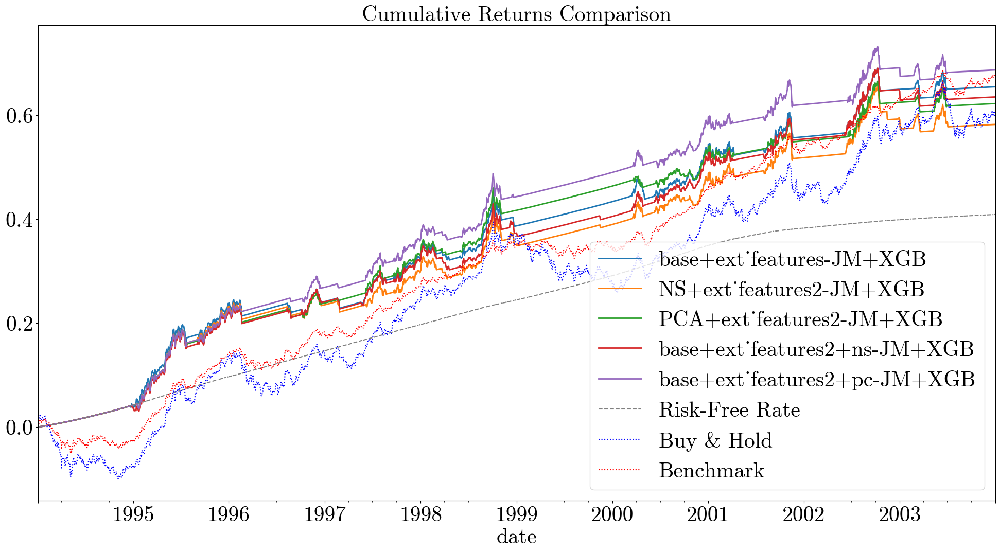

In [47]:
from xgboost import XGBClassifier
from xgboost import XGBRegressor
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import classification_report

# パターン辞書: キーが出力用ラベル、値が (JumpModel設定名, マクロDF)
patterns = {
    'base+ext_features'       : ('base', ext_features_pre),
    'NS+ext_features2'        : ('NS',   ext_features_pre2),
    'PCA+ext_features2'       : ('PCA',  ext_features_pre2),
    'base+ext_features2+ns'    : ('base', ext_features_pre_with_ns),
    'base+ext_features2+pc'    : ('base', ext_features_pre_with_pc),
}

lambda_list = np.logspace(3.5, 5, 8)
reg_alpha_list = [1] #np.logspace(-1, 2, 10)

clf_xgb = []
results_xgb = {}
perf_jm_xgb_dict = {}


for pname, (umodel, ext_features_df) in patterns.items():
    
    best_score = -np.inf
    best_lambda    = None
    best_alpha  = None
    best_model  = None
    
    Xj_tr = processed_train[umodel]
    train_idx  = Xj_tr.index[:-1]
    X_feat_tr = pd.concat([Xj_tr.loc[train_idx],ext_features_df.reindex(train_idx)], axis=1).dropna()

    for lam in lambda_list:
        # --- １．訓練用ラベル作成（JumpModel の predict を使う） ---
        jm = JumpModel(**jm_setting, jump_penalty=lam, n_kernel_features = 1000)
        jm.fit(Xj_tr, dl.ret_ser, sort_by="cumret")
        #raw_proba = jm.predict_proba_online(Xj_tr)
        raw_proba = jm.proba_
        y_train = pd.Series(raw_proba.iloc[1:, 1].values,index=train_idx)

        # --- ２．訓練データ特徴量結合 ---
        y_train = y_train.reindex(X_feat_tr.index)
        
        best_score_for_lam = -np.inf
        best_alpha_for_lam  = None
        best_model_for_lam  = None

        for alpha in reg_alpha_list:
            xgb = XGBRegressor(
                objective="reg:squarederror",
                random_state=42,
                reg_alpha=alpha,
            )
            xgb.fit(X_feat_tr.values, y_train.values)
            
            # 同期間のシャープを計算
            idx      = X_feat_tr.index[1:]
            proba    = xgb.predict(X_feat_tr.values)
            smoothed = pd.Series(proba, index=X_feat_tr.index)\
                           .ewm(halflife=4, adjust=False).mean()
            y_pred   = (smoothed > 0.5).astype(int)
            y_pred   = pd.Series(y_pred[:-1].values, index=idx)
            regime   = 1 - y_pred

            ret      = ret_ser.reindex(idx)
            rf       = rf_test.reindex(idx)
            strat    = ret.where(regime==1, other=rf)
            excess   = strat - rf
            mu       = excess.mean() * 252
            sd       = excess.std()  * np.sqrt(252)
            sharpe   = mu/sd if sd>0 else -np.inf

            if mu > best_score_for_lam:
                best_score_for_lam = mu
                best_alpha_for_lam  = alpha
                best_model_for_lam  = xgb

        # — λ 毎の最良 α を得たので、全体最良と比較
        if best_score_for_lam > best_score:
            best_score = best_score_for_lam
            best_lambda    = lam
            best_alpha  = best_alpha_for_lam
            best_model  = best_model_for_lam

    print(f"[{pname}] Best λ={best_lambda}, Score={best_score:.3f}, Alpha={best_alpha:.3f}")
    importances = pd.Series(best_model.feature_importances_, index=X_feat_tr.columns)
    print("Feature importances:\n", importances.sort_values(ascending=False))

    # --- ４．テストデータ準備・予測 ---
    Xj_val     = processed_val[umodel]
    X_feat_val = pd.concat([
        Xj_val,
        ext_features_df.reindex(Xj_val.index)
    ], axis=1).dropna()

    # 確保インデックスと予測
    pred_idx  = X_feat_val.index[1:]
    proba = best_model.predict(X_feat_val.values)
    #proba     = xgb.predict_proba(X_feat_te)[:,1]
    smoothed  = pd.Series(proba, index=X_feat_val.index).ewm(halflife=4, adjust=False).mean()
    #smoothed  = pd.Series(proba, index=X_feat_val.index)
    y_pred    = (smoothed > 0.5).astype(int)
    y_pred    = pd.Series(y_pred[:-1].values, index=pred_idx)  # 翌日シフト

    jm_chk = JumpModel(**jm_setting, jump_penalty=best_lambda, n_kernel_features = 1000)
    jm_chk.fit(Xj_val, dl.ret_ser, sort_by="cumret")
    labels_test = pd.Series(jm_chk.labels_, index=Xj_val.index)
    #labels_test = pd.Series(jm_chk.predict_online(Xj_val), index=Xj_val.index)

    # ６．分類レポート
    clf_report = classification_report(labels_test.loc[pred_idx],y_pred.loc[labels_test[1:].index],target_names=["growth","crash"],labels = [0,1],zero_division=0)
    print("Classification Report:\n", clf_report)
    
    clf_dict = classification_report(labels_test.loc[pred_idx],y_pred.loc[labels_test[1:].index],target_names=["growth","crash"],labels = [0,1],zero_division=0, output_dict = True)
    n_samples = len(labels_test.loc[pred_idx])
    for label, metrics in clf_dict.items():
        if isinstance(metrics, dict):
            precision = metrics.get('precision',  0)
            recall    = metrics.get('recall',     0)
            f1_score  = metrics.get('f1-score',   0)
            support   = metrics.get('support',    0)
        else:
            precision = recall = f1_score = metrics
            support   = n_samples
        clf_xgb.append({
            'pattern': pname,
            'label': label,
            'precision': precision,
            'recall': recall,
            'f1_score': f1_score,
            'support': support,
        })

    # ７．投資パフォーマンス
    ret_val   = ret_ser.reindex(pred_idx).dropna()
    rf_aligned = rf_test.reindex(pred_idx).fillna(0.0)
    regime     = 1 - y_pred  # Bull=1
    ret_strat  = ret_val.where(regime==1, other=rf_aligned)
    perf_jm_xgb = compute_performance(
        ret_series=ret_strat,
        rf_series =rf_aligned,
        freq=252,
        benchmark=bench.reindex(pred_idx).fillna(0.0)
    )
    perf_jm_xgb_dict[name] = perf_jm_xgb
    print(perf_jm_xgb)

    perf_bench = compute_performance(
        ret_series = bench.reindex(pred_idx).fillna(0.0),
        rf_series  = rf_aligned,
        freq       = 252,
        benchmark  = bench.reindex(pred_idx).fillna(0.0)
    )
    print(perf_bench)

    perf_bh = compute_performance(
        ret_series = ret_val,
        rf_series  = rf_aligned,
        freq       = 252,
        benchmark  = bench.reindex(pred_idx).fillna(0.0)
    )
    print(perf_bh)
    
    cum_bh    = ret_val.cumsum()
    # JM+XGB 戦略の累積リターン
    cum_jm_xgb= ret_strat.cumsum()
    # 無リスク & ベンチマーク
    cum_rf    = rf_aligned.cumsum()
    cum_bench = bench.reindex(pred_idx).fillna(0.0).cumsum()

    plt.figure()
    cum_bh.plot(label="Buy&Hold")
    cum_jm_xgb.plot(label="JM+XGB Strategy")
    cum_rf.plot(label="Risk-Free Rate", linestyle="--", color="gray")
    cum_bench.plot(label="Benchmark", linestyle="--", color="red")

    ymin = min(cum_bh.min(), cum_jm_xgb.min(), cum_rf.min(), cum_bench.min())
    ymax = max(cum_bh.max(), cum_jm_xgb.max(), cum_rf.max(), cum_bench.max()) * 1.1

    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime==0), alpha=0.3, color="red",   label="Bear Regime"
    )
    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime==1), alpha=0.3, color="green", label="Bull Regime"
    )

    plt.legend(loc="upper left")
    plt.title(f"{pname}: Buy&Hold vs JM+XGB")
    plt.tight_layout()
    plt.show()

    # ９．結果格納
    results_xgb[pname] = {
        'best_params':         best_lambda,
        'best_cv_score':       best_sharpe,
        'classification_report': clf_report,
        'perf_bh':             perf_bh,
        'perf_jm_xgb':         perf_jm_xgb,
        'cum_bh':              cum_bh,
        'cum_strat':           cum_jm_xgb,
        'figure':              plt.gcf()
    }

    plt.close()

for name, res in results_xgb.items():
    row = {
        'pred':        "XGB",
        'model':       name,
        'annual_ret':res['perf_jm_xgb']['annual_return'],
        'annual_vol':res['perf_jm_xgb']['annual_vol'],
        'sharpe':    res['perf_jm_xgb']['sharpe'],
        'max_drawdown': res['perf_jm_xgb']['max_drawdown'],
        'sortino':   res['perf_jm_xgb']['sortino'],
        'cvar_99':   res['perf_jm_xgb']['cvar_99'],
        'calmar':    res['perf_jm_xgb']['calmar'],
        'information_ratio': res['perf_jm_xgb']['information_ratio'],
    }
    perf_table.append(row)
perf_df = pd.DataFrame(perf_table).set_index('model')
perf_df = perf_df.map(lambda cell: cell.item() if isinstance(cell, pd.Series) and cell.size == 1 else cell)
display(perf_df)

plt.figure()
for name, res in results_xgb.items():
    res['cum_strat'].plot(label=f"{name}-JM+XGB", linewidth=2)
rf_test[pred_index].cumsum().plot(label="Risk-Free Rate", linestyle='--', color='gray')
cum_bh.plot(label="Buy & Hold", linestyle=':', color='blue')
first = next(iter(results_jmonline.values()))
bench.reindex(first['cum_bh'].index).fillna(0).cumsum() \
     .plot(label="Benchmark", linestyle=':', color='red')

plt.legend()
plt.title("Cumulative Returns Comparison")
plt.show()

## Performance comparison (Testing period)

[base] Best λ = 5179.474679231213, CV Sharpe = 0.579
Classification Report:
               precision    recall  f1-score   support

      growth       0.99      0.47      0.64      2763
       crash       0.65      1.00      0.79      2776

    accuracy                           0.73      5539
   macro avg       0.82      0.73      0.71      5539
weighted avg       0.82      0.73      0.71      5539

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0        0.01499    0.074754  0.200518     -0.306082  0.334516 -0.015402  0.048972           0.200497
   annual_return  annual_vol   sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.006852     0.03627  0.18892     -0.131643  0.280067 -0.010917  0.052051          -0.161038


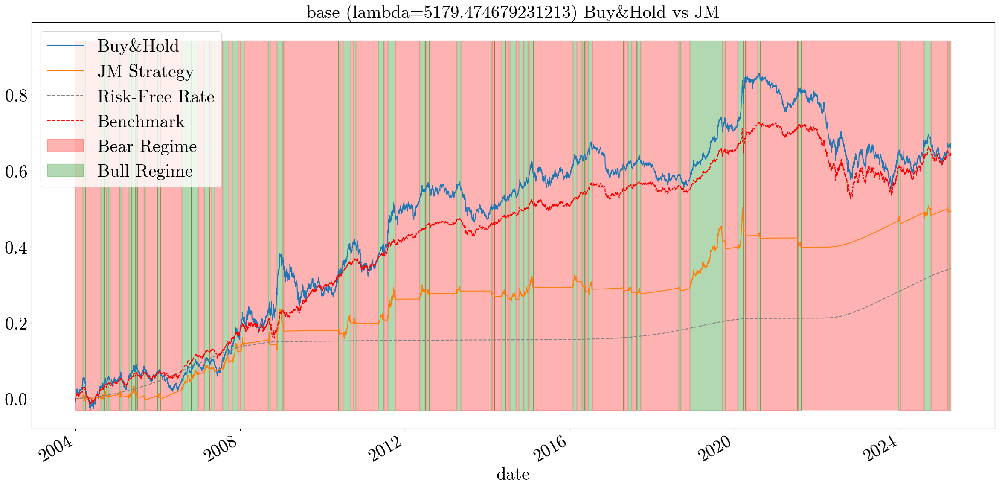

[NS] Best λ = 37275.93720314938, CV Sharpe = 0.532
Classification Report:
               precision    recall  f1-score   support

      growth       0.99      0.44      0.61      2922
       crash       0.62      1.00      0.76      2617

    accuracy                           0.70      5539
   macro avg       0.80      0.72      0.69      5539
weighted avg       0.81      0.70      0.68      5539

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0        0.01499    0.074754  0.200518     -0.306082  0.334516 -0.015402  0.048972           0.200497
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0       0.006024    0.037541  0.160455     -0.097988  0.237168 -0.011379  0.061473          -0.178667


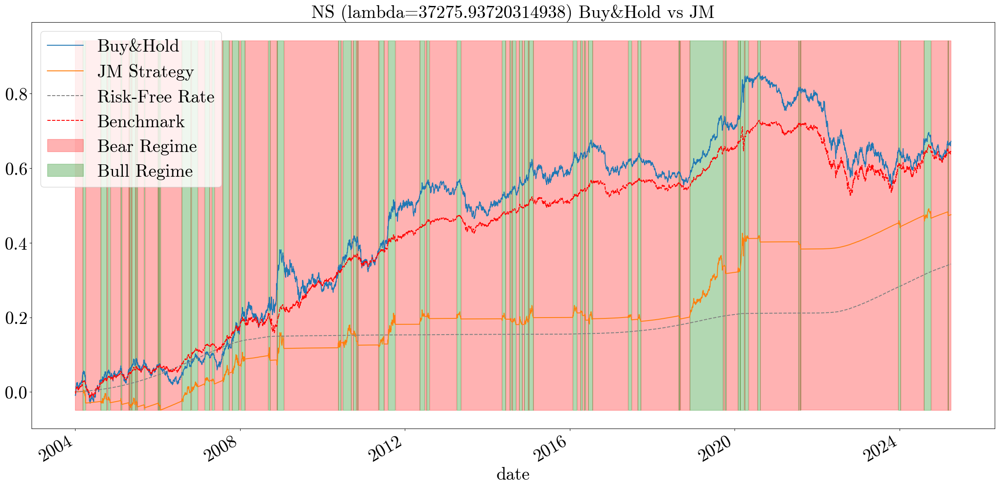

[PCA] Best λ = 8483.428982440717, CV Sharpe = 0.556
Classification Report:
               precision    recall  f1-score   support

      growth       1.00      0.47      0.64      2792
       crash       0.65      1.00      0.79      2747

    accuracy                           0.73      5539
   macro avg       0.82      0.73      0.71      5539
weighted avg       0.82      0.73      0.71      5539

   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99    calmar  information_ratio
0        0.01499    0.074754  0.200518     -0.306082  0.334516 -0.015402  0.048972           0.200497
   annual_return  annual_vol    sharpe  max_drawdown   sortino   cvar_99   calmar  information_ratio
0       0.006555     0.03658  0.179203     -0.107605  0.264455 -0.011118  0.06092          -0.167176


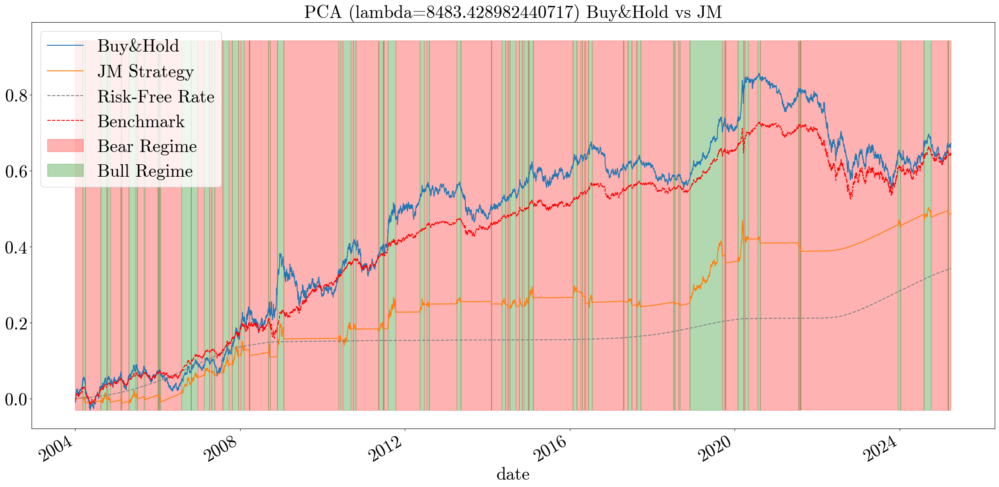

,pred,annual_ret,annual_vol,sharpe,max_drawdown,sortino,cvar_99,calmar,information_ratio
model,,,,,,,,,
base,JM shift,0.006852,0.036270,0.188920,-0.131643,0.280067,-0.010917,0.052051,-0.161038
NS,JM shift,0.006024,0.037541,0.160455,-0.097988,0.237168,-0.011379,0.061473,-0.178667
PCA,JM shift,0.006555,0.036580,0.179203,-0.107605,0.264455,-0.011118,0.060920,-0.167176


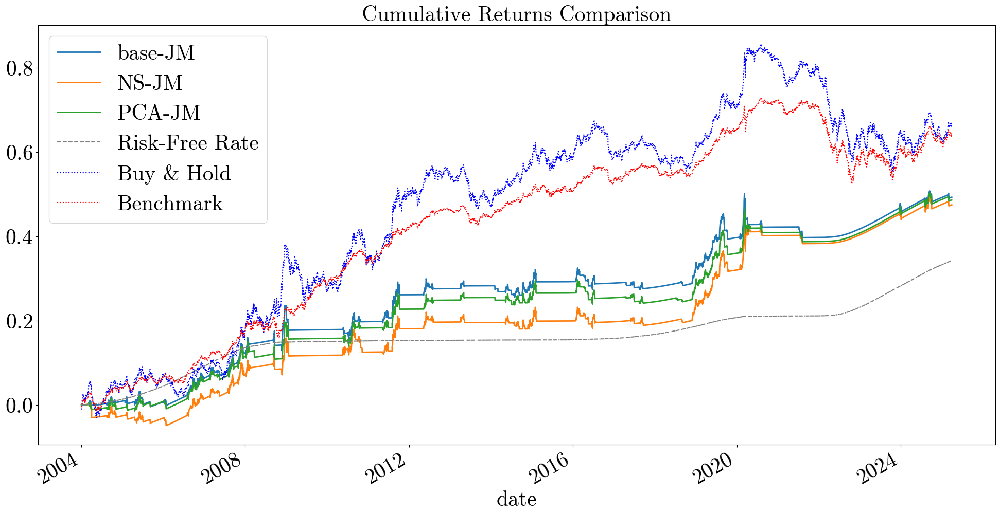

In [48]:
from sklearn.metrics import classification_report

penalty_grid = {
    'base': np.logspace(3.5, 5, 8),
    'NS':   np.logspace(3.5, 5, 8),
    'PCA':  np.logspace(3.5, 5, 8),
}

tscv = TimeSeriesSplit(n_splits=3)

#online_perf_test    = {}
perf_bh_dict_test    = {}

clf_jmonline_test = []
perf_jm_dict_test    = {}
results_jmonline_test = {}

for name in settings:
    X_tr = pd.concat([processed_train[name],processed_val[name]],axis=0,ignore_index=False)

    # --- λ の時系列CV ---
    grid = penalty_grid[name]
    cv_sharpes = []
    for lam in grid:
        fold_sharpes = []
        for train_idx, val_idx in tscv.split(X_tr):
            # --- expand-fit on train fold ---
            X_t, y_t = X_tr.iloc[train_idx], dl.ret_ser.iloc[train_idx]
            jm = JumpModel(**jm_setting, jump_penalty=lam, n_kernel_features = 1000)
            jm.fit(X_t, y_t, sort_by="cumret")

            # --- online inference on validation fold ---
            X_v = X_tr.iloc[val_idx]
            y_v = dl.ret_ser.iloc[val_idx]
            rf_v = rf_test.reindex(X_v.index).fillna(0.0)

            raw = jm.predict_online(X_v)
            labels = pd.Series(raw.values, index=X_v.index).shift(1).dropna()
            regime = 1 - labels

            # align returns & rf to the shifted index
            ret = y_v.reindex(labels.index)
            rf  = rf_v.reindex(labels.index)

            # strategy return: Bull→ret, Bear→rf
            ret_strat = ret.where(regime==1, other=rf)

            # --- excess returns over rf ---
            excess = ret_strat - rf

            # annualized Sharpe of excess
            mu  = excess.mean() * 252
            sd  = ret_strat.std() * np.sqrt(252)
            sharpe = mu/sd if sd>0 else -np.inf
            fold_sharpes.append(sharpe)

        cv_sharpes.append(np.mean(fold_sharpes))

    best_idx     = int(np.argmax(cv_sharpes))
    best_penalty[name] = grid[best_idx]

    # 最適 λ を選択
    idx_star = int(np.argmax(cv_sharpes))
    lam_star = penalty_grid[name][idx_star]
    print(f"[{name}] Best λ = {lam_star}, CV Sharpe = {cv_sharpes[idx_star]:.3f}")

    # --- フル訓練で再フィット & オンライン推論 ---
    jm_best = JumpModel(**jm_setting, jump_penalty=lam_star, n_kernel_features = 1000)
    jm_best.fit(X_tr, dl.ret_ser, sort_by="cumret")
    labels_online_raw = jm_best.predict_online(processed_test[name])

    # online inference 用に時系列でシフト
    idx_pred = processed_test[name].index[1:]
    labels_online = pd.Series(labels_online_raw[:-1].values, index=idx_pred)
    regime_online = 1 - labels_online

    jm_chk = JumpModel(**jm_setting, jump_penalty=lam_star, n_kernel_features = 1000)
    jm_chk.fit(processed_test[name], dl.ret_ser, sort_by="cumret")
    labels_fit = pd.Series(jm_chk.labels_, index=processed_test[name].index)

    # ６．分類レポート
    clf_report = classification_report(labels_fit.loc[idx_pred],labels_online,target_names=["growth","crash"],labels = [0,1],zero_division=0)
    print("Classification Report:\n", clf_report)
    
    clf_dict = classification_report(labels_fit.loc[idx_pred],labels_online,target_names=["growth","crash"],zero_division=0,labels = [0,1], output_dict = True)
    n_samples = len(labels_fit.loc[idx_pred])
    for label, metrics in clf_dict.items():
        if isinstance(metrics, dict):
            precision = metrics.get('precision',  0)
            recall    = metrics.get('recall',     0)
            f1_score  = metrics.get('f1-score',   0)
            support   = metrics.get('support',    0)
        else:
            precision = recall = f1_score = metrics
            support   = n_samples
        clf_jmonline_test.append({
            'pattern': name,
            'label': label,
            'precision': precision,
            'recall': recall,
            'f1_score': f1_score,
            'support': support,
        })

    # テスト期間のリターン・無リスク・ベンチマーク
    y_te    = dl.ret_ser.reindex(idx_pred).dropna()
    rf_te   = rf_test.reindex(idx_pred).fillna(0.0)
    bench_te= bench.reindex(idx_pred).fillna(0.0)

    # Buy&Hold
    ret_bh = y_te
    perf_bh = compute_performance(
        ret_series = ret_bh,
        rf_series  = rf_te,
        freq       = 252,
        benchmark  = rf_te
    )
    perf_bh_dict_test[name] = perf_bh
    print(perf_bh)

    # JM Strategy
    ret_jm = y_te.where(regime_online==1, other=rf_te)
    perf_jm = compute_performance(
        ret_series = ret_jm,
        rf_series  = rf_te,
        freq       = 252,
        benchmark  = bench_te
    )
    perf_jm_dict_test[name] = perf_jm
    print(perf_jm)

    # 累積プロット（オリジナル設定を維持）
    cum_bh   = ret_bh.cumsum()
    cum_jm   = ret_jm.cumsum()
    cum_rf   = rf_te.cumsum()
    cum_bench= bench_te.cumsum()

    plt.figure()
    cum_bh.plot(label="Buy&Hold")
    cum_jm.plot(label="JM Strategy")
    cum_rf.plot(label="Risk-Free Rate", linestyle="--", color="gray")
    cum_bench.plot(label="Benchmark",    linestyle="--", color="red")
    ymin = min(cum_bh.min(), cum_jm.min(), cum_rf.min(), cum_bench.min())
    ymax = max(cum_bh.max(), cum_jm.max(), cum_rf.max(), cum_bench.max()) * 1.1

    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime_online==0),
        alpha=0.3, color="red",   label="Bear Regime"
    )
    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime_online==1),
        alpha=0.3, color="green", label="Bull Regime"
    )
    plt.legend(loc="upper left")
    plt.title(f"{name} (lambda={lam_star}) Buy&Hold vs JM")
    plt.tight_layout()
    plt.show()

    results_jmonline_test[name] = {
        'best_params':         best_penalty[name],
        'best_cv_score':       cv_sharpes[best_idx],
        'classification_report': clf_report,
        'perf_bh':             perf_bh,
        'perf_jm_shift':         perf_jm,
        'cum_bh':              cum_bh,
        'cum_strat':           cum_jm,
    }

    # （プロットはここでも描けますし、後でまとめて描いてもOK）
    plt.close()

pred_test_index = processed_test['base'].index[1:]
bh_test = compute_performance(ret_series=dl.ret_ser[pred_test_index], rf_series=rf_test, freq=252, benchmark=rf_test)
cum_bh_test= dl.ret_ser[pred_test_index].cumsum()

results_jmonline_test['Buy&Hold'] = {
    'best_params': None,
    'best_cv_score':   None,
    'classification_report': None,
    'perf_bh':     bh_test,
    'perf_jm_shift':None,
    'cum_bh':      cum_bh_test,
    'cum_strat':   None
}

perf_table_test = []
for name, res in results_jmonline_test.items():
    jm = res.get('perf_jm_shift')
    bh = res['perf_bh']
    if jm is None:
        perf_table.append({
            'pred':      'Buy & Hold',
            'model':     name,
            'annual_ret':   bh['annual_return'],
            'annual_vol':   bh['annual_vol'],
            'sharpe':       bh['sharpe'],
            'max_drawdown': bh['max_drawdown'],
            'sortino':      bh['sortino'],
            'cvar_99':      bh['cvar_99'],
            'calmar':       bh['calmar'],
            'information_ratio': bh['information_ratio'],
        })
    if jm is not None:
        perf_table_test.append({
            'pred':      'JM shift',
            'model':     name,
            'annual_ret':   jm['annual_return'],
            'annual_vol':   jm['annual_vol'],
            'sharpe':       jm['sharpe'],
            'max_drawdown': jm['max_drawdown'],
            'sortino':      jm['sortino'],
            'cvar_99':      jm['cvar_99'],
            'calmar':       jm['calmar'],
            'information_ratio': jm['information_ratio'],
        })
perf_df_test = pd.DataFrame(perf_table_test).set_index('model')
perf_df_test = perf_df_test.map(lambda x: x.item() if isinstance(x, pd.Series) else x)
display(perf_df_test)

# 4) 累積リターンプロット
plt.figure()
for name, res in results_jmonline_test.items():
    if res['cum_strat'] is not None:
        res['cum_strat'].plot(label=f"{name}-JM", linewidth=2)
rf_test[pred_test_index].cumsum().plot(label="Risk-Free Rate", linestyle='--', color='gray')
cum_bh.plot(label="Buy & Hold", linestyle=':', color='blue')
first = next(iter(results_jmonline_test.values()))
bench.reindex(first['cum_bh'].index).fillna(0).cumsum() \
     .plot(label="Benchmark", linestyle=':', color='red')

plt.legend()
plt.title("Cumulative Returns Comparison")
plt.show()

[base+ext_features] Best λ=8483.428982440717, Score=0.050
Feature importances:
 sortino_20           0.796093
DD-log_20            0.063059
sortino_60           0.032941
DD-log_60            0.028305
ret_60               0.020401
ret_20               0.010742
y2_diff_ewm          0.007357
y10_diff_ewm         0.006183
vix_logdiff_ewm      0.006006
ret_5                0.005619
slope_diff_ewm       0.004657
DD-log_5             0.004386
sortino_5            0.003647
vol_diff_ewma        0.003172
bi10_logdiff_ewma    0.002937
move_logdiff_ewma    0.002356
bi5_logdiff_ewma     0.002140
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.90      0.66      0.76      2759
       crash       0.74      0.93      0.82      2780

    accuracy                           0.80      5539
   macro avg       0.82      0.80      0.79      5539
weighted avg       0.82      0.80      0.79      5539

   annual_return  annual_vol   sharpe  max_d

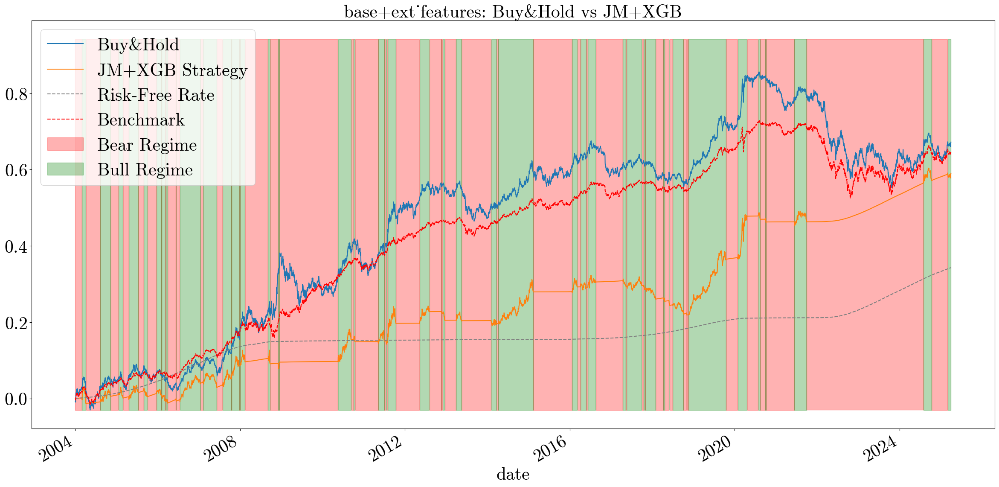

[NS+ext_features2] Best λ=13894.95494373136, Score=0.053
Feature importances:
 sortino_20            0.795198
sortino_60            0.062681
DD-log_60             0.034543
DD-log_20             0.026324
y10_diff_ewm          0.012810
curv_diff_ewma_63     0.009609
ret_60                0.007718
ret_5                 0.007010
vix_logdiff_ewm       0.006897
slope_diff_ewma_63    0.005763
slope_diff_ewma_5     0.004438
level_diff_ewma_63    0.003818
move_logdiff_ewma     0.003409
level_diff_ewma_5     0.003123
ret_20                0.003078
y2_diff_ewm           0.002961
DD-log_5              0.002483
vol_diff_ewma         0.002288
curv_diff_ewma_5      0.001725
bi10_logdiff_ewma     0.001664
sortino_5             0.001379
bi5_logdiff_ewma      0.001081
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.95      0.62      0.75      2923
       crash       0.69      0.97      0.81      2616

    accuracy                        

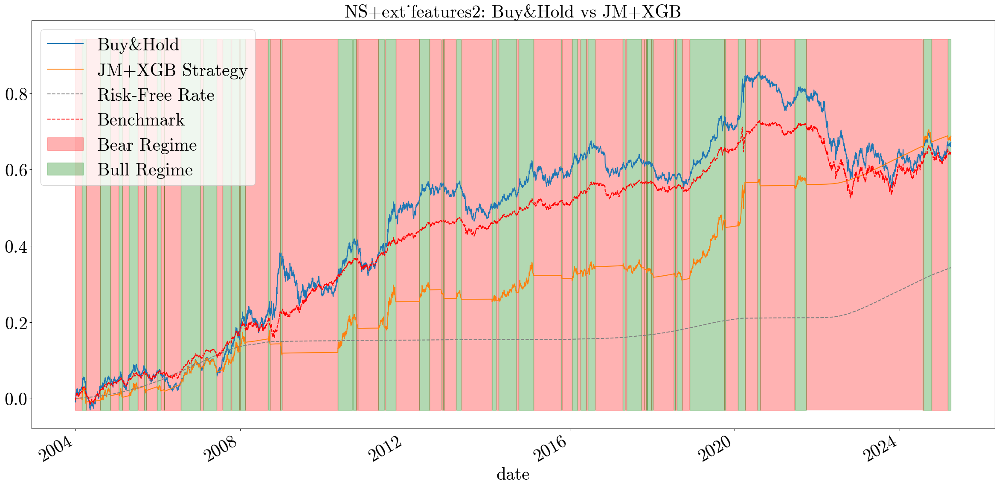

[PCA+ext_features2] Best λ=22758.459260747863, Score=0.052
Feature importances:
 sortino_20           0.785598
DD-log_20            0.061077
sortino_60           0.033323
DD-log_60            0.018915
ret_60               0.018603
ret_20               0.013646
vix_logdiff_ewm      0.008722
ret_5                0.008489
PC1_diff_ewma_63     0.007255
PC1_diff_ewma_5      0.005444
bi5_logdiff_ewma     0.005241
y10_diff_ewm         0.005183
sortino_5            0.004158
vol_diff_ewma        0.003645
y2_diff_ewm          0.003389
bi10_logdiff_ewma    0.002680
PC4_diff_ewma_63     0.002305
DD-log_5             0.002144
PC2_diff_ewma_5      0.001894
move_logdiff_ewma    0.001614
PC5_diff_ewma_63     0.001347
PC2_diff_ewma_63     0.001239
PC3_diff_ewma_63     0.001162
PC5_diff_ewma_5      0.001116
PC3_diff_ewma_5      0.001078
PC4_diff_ewma_5      0.000732
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.92      0.69      0.79  

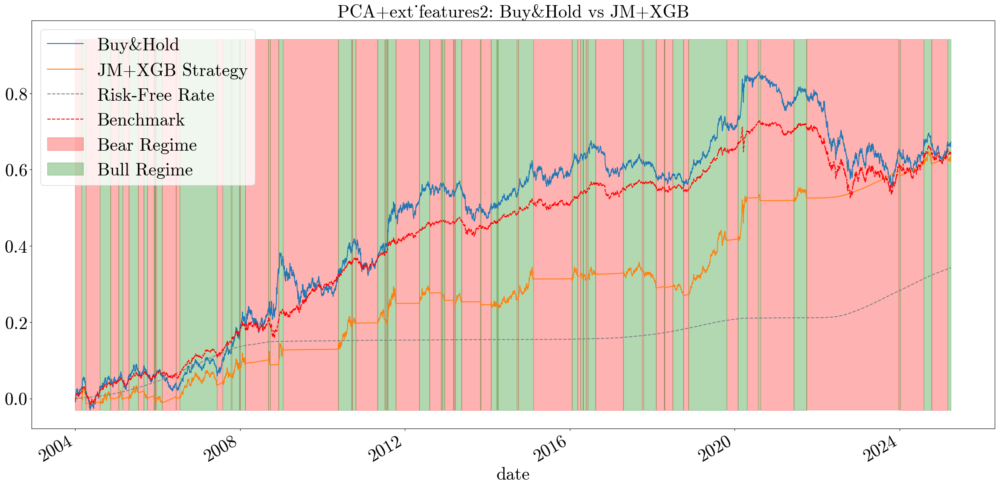

[base+ext_features2+ns] Best λ=22758.459260747863, Score=0.051
Feature importances:
 sortino_20            0.777330
DD-log_60             0.051317
DD-log_20             0.048014
sortino_60            0.034921
ret_60                0.016767
y10_diff_ewm          0.011844
vix_logdiff_ewm       0.007995
slope_diff_ewma_5     0.005710
level_diff_ewma_63    0.005504
y2_diff_ewm           0.005059
sortino_5             0.004636
curv_diff_ewma_63     0.004306
slope_diff_ewma_63    0.004139
ret_20                0.003914
DD-log_5              0.003747
ret_5                 0.003476
level_diff_ewma_5     0.003465
vol_diff_ewma         0.002460
bi10_logdiff_ewma     0.002023
curv_diff_ewma_5      0.001653
move_logdiff_ewma     0.001128
bi5_logdiff_ewma      0.000592
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.88      0.67      0.76      2787
       crash       0.73      0.91      0.81      2752

    accuracy                  

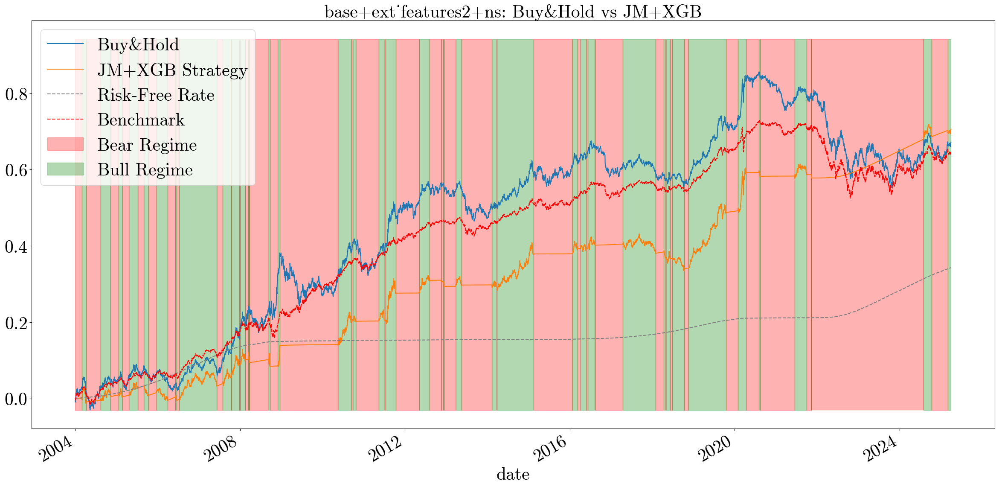

[base+ext_features2+pc] Best λ=37275.93720314938, Score=0.050
Feature importances:
 sortino_20           0.778462
DD-log_20            0.057748
DD-log_60            0.043814
sortino_60           0.030108
ret_60               0.014770
y10_diff_ewm         0.014053
vix_logdiff_ewm      0.007208
y2_diff_ewm          0.006306
PC1_diff_ewma_5      0.005770
ret_5                0.005501
sortino_5            0.005247
DD-log_5             0.004457
PC1_diff_ewma_63     0.004086
vol_diff_ewma        0.003299
PC2_diff_ewma_63     0.002992
ret_20               0.002604
PC2_diff_ewma_5      0.002512
move_logdiff_ewma    0.001762
bi10_logdiff_ewma    0.001615
PC3_diff_ewma_5      0.001482
PC3_diff_ewma_63     0.001340
bi5_logdiff_ewma     0.001166
PC4_diff_ewma_63     0.001058
PC5_diff_ewma_63     0.001055
PC4_diff_ewma_5      0.000796
PC5_diff_ewma_5      0.000788
dtype: float32
Classification Report:
               precision    recall  f1-score   support

      growth       0.88      0.68      0.7

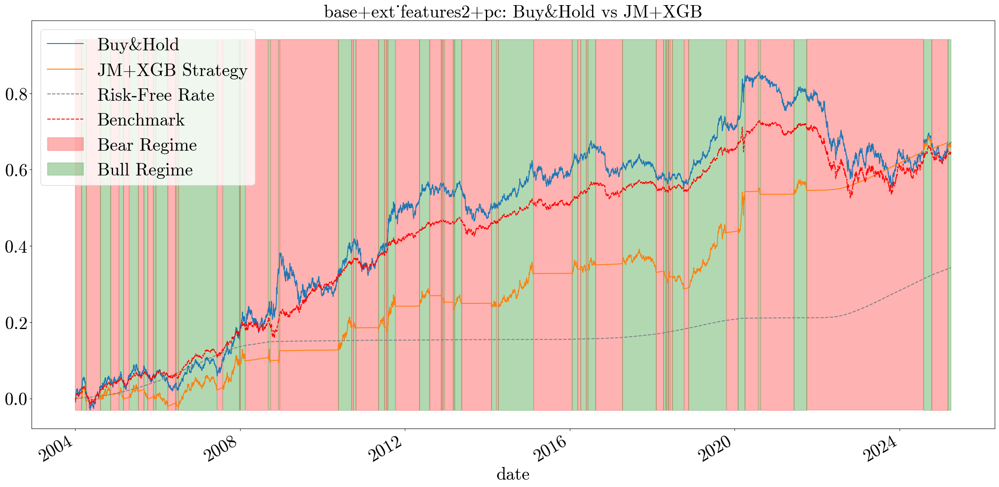

,pred,annual_ret,annual_vol,sharpe,max_drawdown,sortino,cvar_99,calmar,information_ratio
model,,,,,,,,,
base,JM shift,0.006852,0.036270,0.188920,-0.131643,0.280067,-0.010917,0.052051,-0.161038
NS,JM shift,0.006024,0.037541,0.160455,-0.097988,0.237168,-0.011379,0.061473,-0.178667
PCA,JM shift,0.006555,0.036580,0.179203,-0.107605,0.264455,-0.011118,0.060920,-0.167176
base+ext_features,XGB,0.011265,0.040880,0.275570,-0.122869,0.417710,-0.011084,0.091685,-0.058991
NS+ext_features2,XGB,0.015704,0.040677,0.386063,-0.074393,0.586641,-0.011284,0.211094,0.044458
PCA+ext_features2,XGB,0.013239,0.041739,0.317180,-0.105056,0.483028,-0.011294,0.126015,-0.012834
base+ext_features2+ns,XGB,0.016517,0.041917,0.394040,-0.108345,0.605377,-0.011334,0.152448,0.063721
base+ext_features2+pc,XGB,0.014876,0.041560,0.357925,-0.120776,0.550202,-0.011056,0.123166,0.025427


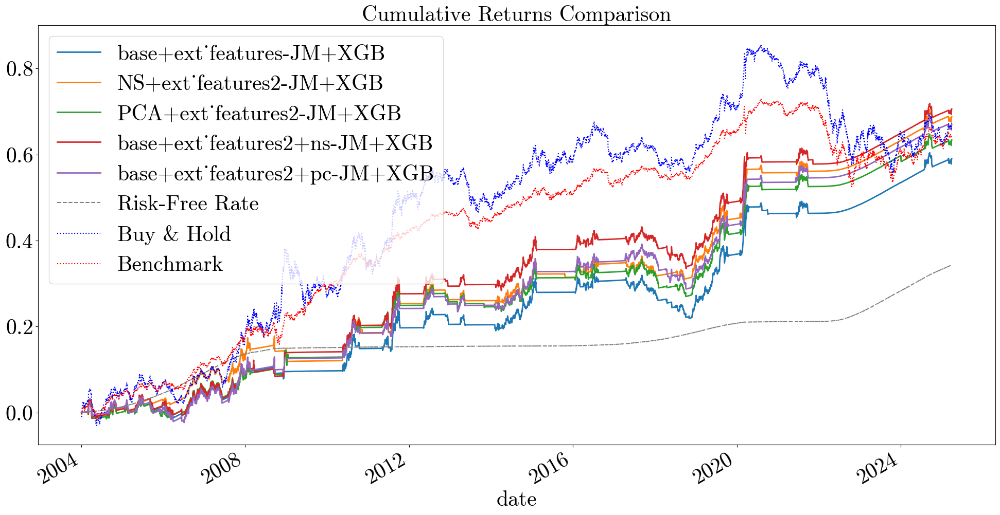

In [49]:
from xgboost import XGBClassifier
from xgboost import XGBRegressor
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import classification_report

patterns = {
    'base+ext_features'       : ('base', ext_features_pre),
    'NS+ext_features2'        : ('NS',   ext_features_pre2),
    'PCA+ext_features2'       : ('PCA',  ext_features_pre2),
    'base+ext_features2+ns'    : ('base', ext_features_pre_with_ns),
    'base+ext_features2+pc'    : ('base', ext_features_pre_with_pc),
}

#lambda_list = list(range(100, 200, 10))
lambda_list = np.logspace(3.5, 5, 8)

clf_xgb_test = []
perf_jm_xgb_dict_test = {}
results_xgb_test = {}

for pname, (umodel, ext_features_df) in patterns.items():
    
    best_model = None
    best_lambda = None
    best_score = -np.inf
    Xj_tr = pd.concat([processed_train[umodel],processed_val[umodel]],axis=0,ignore_index=False)
    train_idx  = Xj_tr.index[:-1]
    X_feat_tr = pd.concat([Xj_tr.loc[train_idx],ext_features_df.reindex(train_idx)], axis=1).dropna()

    for lam in lambda_list:
        # --- １．訓練用ラベル作成（JumpModel の predict を使う） ---
        jm = JumpModel(**jm_setting, jump_penalty=lam, n_kernel_features = 1000)
        jm.fit(Xj_tr, dl.ret_ser, sort_by="cumret")
        raw_proba = jm.proba_
        y_train = pd.Series(raw_proba.iloc[1:, 1].values,index=train_idx)

        # --- ２．訓練データ特徴量結合 ---
        y_train = y_train.reindex(X_feat_tr.index)
        
        xgb_tr = XGBRegressor(objective="reg:squarederror",random_state=42, reg_alpha=1)
        xgb_tr.fit(X_feat_tr.values, y_train.values)
        idx  = X_feat_tr.index[1:]
        proba = xgb_tr.predict(X_feat_tr.values)
        smoothed  = pd.Series(proba, index=X_feat_tr.index).ewm(halflife=4, adjust=False).mean()
        y_pred    = (smoothed > 0.5).astype(int)
        y_pred    = pd.Series(y_pred[:-1].values, index=idx)  # 翌日シフト
        regime = 1 - y_pred
        
        ret = ret_ser.reindex(idx)
        rf  = rf_test.reindex(idx)
        ret_strat = ret.where(regime==1, other=rf)
        excess = ret_strat - rf
        mu  = excess.mean() * 252
        sd  = excess.std() * np.sqrt(252)
        sharpe = mu/sd if sd>0 else -np.inf
        if mu > best_score:
            best_score = mu
            best_model = xgb_tr
            best_lambda = lam


    print(f"[{pname}] Best λ={best_lambda}, Score={best_score:.3f}")
    importances = pd.Series(best_model.feature_importances_, index=X_feat_tr.columns)
    print("Feature importances:\n", importances.sort_values(ascending=False))

    # --- ４．テストデータ準備・予測 ---
    Xj_val     = processed_test[umodel]
    X_feat_val = pd.concat([
        Xj_val,
        ext_features_df.reindex(Xj_val.index)
    ], axis=1).dropna()

    # 確保インデックスと予測
    pred_idx  = X_feat_val.index[1:]
    proba = best_model.predict(X_feat_val.values)
    #proba     = xgb.predict_proba(X_feat_te)[:,1]
    smoothed  = pd.Series(proba, index=X_feat_val.index).ewm(halflife=4, adjust=False).mean()
    #smoothed  = pd.Series(proba, index=X_feat_val.index)
    y_pred    = (smoothed > 0.5).astype(int)
    y_pred    = pd.Series(y_pred[:-1].values, index=pred_idx)  # 翌日シフト

    jm_chk = JumpModel(**jm_setting, jump_penalty=best_lambda, n_kernel_features = 1000)
    jm_chk.fit(Xj_val, dl.ret_ser, sort_by="cumret")
    labels_test = pd.Series(jm_chk.labels_, index=Xj_val.index)

    # ６．分類レポート
    clf_report = classification_report(labels_test.loc[pred_idx],y_pred.loc[labels_test[1:].index],target_names=["growth","crash"],labels = [0,1],zero_division=0)
    print("Classification Report:\n", clf_report)
    
    clf_dict = classification_report(labels_test.loc[pred_idx],y_pred.loc[labels_test[1:].index],target_names=["growth","crash"],labels = [0,1],zero_division=0, output_dict = True)
    n_samples = len(labels_test.loc[pred_idx])
    for label, metrics in clf_dict.items():
        if isinstance(metrics, dict):
            precision = metrics.get('precision',  0)
            recall    = metrics.get('recall',     0)
            f1_score  = metrics.get('f1-score',   0)
            support   = metrics.get('support',    0)
        else:
            precision = recall = f1_score = metrics
            support   = n_samples
        clf_xgb_test.append({
            'pattern': pname,
            'label': label,
            'precision': precision,
            'recall': recall,
            'f1_score': f1_score,
            'support': support,
        })


    # ７．投資パフォーマンス
    ret_val   = ret_ser.reindex(pred_idx).dropna()
    rf_aligned = rf_test.reindex(pred_idx).fillna(0.0)
    regime     = 1 - y_pred  # Bull=1
    ret_strat  = ret_val.where(regime==1, other=rf_aligned)
    perf_jm_xgb = compute_performance(
        ret_series=ret_strat,
        rf_series =rf_aligned,
        freq=252,
        benchmark=bench.reindex(pred_idx).fillna(0.0)
    )
    perf_jm_xgb_dict_test[name] = perf_jm_xgb
    print(perf_jm_xgb)
    cum_bh    = ret_val.cumsum()
    # JM+XGB 戦略の累積リターン
    cum_jm_xgb= ret_strat.cumsum()
    # 無リスク & ベンチマーク
    cum_rf    = rf_aligned.cumsum()
    cum_bench = bench.reindex(pred_idx).fillna(0.0).cumsum()

    plt.figure()
    cum_bh.plot(label="Buy&Hold")
    cum_jm_xgb.plot(label="JM+XGB Strategy")
    cum_rf.plot(label="Risk-Free Rate", linestyle="--", color="gray")
    cum_bench.plot(label="Benchmark", linestyle="--", color="red")

    ymin = min(cum_bh.min(), cum_jm_xgb.min(), cum_rf.min(), cum_bench.min())
    ymax = max(cum_bh.max(), cum_jm_xgb.max(), cum_rf.max(), cum_bench.max()) * 1.1

    # ベア／ブルの塗り分け
    regime = 1 - y_pred  # Bull=1, Bear=0
    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime==0), alpha=0.3, color="red",   label="Bear Regime"
    )
    plt.fill_between(
        cum_bh.index, ymin, ymax,
        where=(regime==1), alpha=0.3, color="green", label="Bull Regime"
    )

    plt.legend(loc="upper left")
    plt.title(f"{pname}: Buy&Hold vs JM+XGB")
    plt.tight_layout()
    plt.show()

    # ９．結果格納
    results_xgb_test[pname] = {
        'best_params':         best_lambda,
        'best_cv_score':       best_score,
        'classification_report': clf_report,
        'perf_bh':             perf_bh,
        'perf_jm_xgb':         perf_jm_xgb,
        'cum_bh':              cum_bh,
        'cum_strat':           cum_jm_xgb,
        'figure':              plt.gcf()
    }

    plt.close()


pred_test_index = processed_test['base'].index[1:]
bh_test = compute_performance(ret_series=dl.ret_ser[pred_test_index], rf_series=rf_test, freq=252, benchmark=rf_test)
cum_bh_test= dl.ret_ser[pred_test_index].cumsum()


for name, res in results_xgb_test.items():
    row = {
        'pred':        "XGB",
        'model':       name,
        'annual_ret':res['perf_jm_xgb']['annual_return'],
        'annual_vol':res['perf_jm_xgb']['annual_vol'],
        'sharpe':    res['perf_jm_xgb']['sharpe'],
        'max_drawdown': res['perf_jm_xgb']['max_drawdown'],
        'sortino':   res['perf_jm_xgb']['sortino'],
        'cvar_99':   res['perf_jm_xgb']['cvar_99'],
        'calmar':    res['perf_jm_xgb']['calmar'],
        'information_ratio': res['perf_jm_xgb']['information_ratio'],
    }
    perf_table_test.append(row)
perf_df_test = pd.DataFrame(perf_table_test).set_index('model')
perf_df_test = perf_df_test.map(lambda cell: cell.item() if isinstance(cell, pd.Series) and cell.size == 1 else cell)
display(perf_df_test)

plt.figure()
for name, res in results_xgb_test.items():
    res['cum_strat'].plot(label=f"{name}-JM+XGB", linewidth=2)
rf_test[pred_test_index].cumsum().plot(label="Risk-Free Rate", linestyle='--', color='gray')
cum_bh_test.plot(label="Buy & Hold", linestyle=':', color='blue')
first = next(iter(results_xgb_test.values()))
bench.reindex(first['cum_bh'].index).fillna(0).cumsum() \
     .plot(label="Benchmark", linestyle=':', color='red')

plt.legend()
plt.title("Cumulative Returns Comparison")
plt.show()

In [50]:
perf_df_merged = pd.concat([perf_df, perf_df_test], axis=0)
perf_df_merged.to_csv("perf_" + asset +"_" + hlte + ".csv")

In [51]:
display(perf_df_merged)

,pred,annual_ret,annual_vol,sharpe,max_drawdown,sortino,cvar_99,calmar,information_ratio
model,,,,,,,,,
base+ext_features,XGB_roll,0.016737,0.045333,0.369207,-0.121824,0.559462,-0.012281,0.137388,-0.030181
NS+ext_features2,XGB_roll,0.021300,0.047943,0.444279,-0.121337,0.683171,-0.012576,0.175546,0.079288
PCA+ext_features2,XGB_roll,0.013755,0.045738,0.300747,-0.145825,0.454849,-0.012294,0.094328,-0.101627
base+ext_features+ns,XGB_roll,0.014970,0.045677,0.327748,-0.125865,0.494399,-0.012358,0.118940,-0.072433
base+ext_features+pc,XGB_roll,0.012113,0.045733,0.264861,-0.132217,0.397682,-0.012378,0.091614,-0.141091
base+ext_features,XGB,0.023750,0.045319,0.524074,-0.085305,0.786831,-0.012554,0.278418,-0.048471
NS+ext_features2,XGB,0.016751,0.045912,0.364850,-0.090553,0.537557,-0.012959,0.184984,-0.224212
PCA+ext_features2,XGB,0.020634,0.043156,0.478114,-0.086930,0.710447,-0.012388,0.237357,-0.127540
base+ext_features2+ns,XGB,0.021862,0.045616,0.479263,-0.079049,0.717657,-0.012738,0.276563,-0.096231


In [52]:
df_clf = pd.DataFrame(columns=['pattern', 'label', 'precision', 'recall', 'f1_score', 'support'])
clf_list = [clf_jmonline, clf_xgb, clf_jmonline_test, clf_xgb_test]
for i, c in enumerate(clf_list):
    df_temp = pd.DataFrame(c)
    df_clf = pd.concat([df_clf, df_temp], axis = 0, ignore_index=True)
df_clf.to_csv("clf_report_" + asset + "_" + hlte + ".csv", index=False)

/var/folders/27/3yxrjnr94l12ymwg7m474pph0000gn/T/ipykernel_12381/525591409.py:5: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_clf = pd.concat([df_clf, df_temp], axis = 0, ignore_index=True)


In [53]:
reports = {
    pattern: info['classification_report']
    for pattern, info in results_jmonline.items()
}
for pattern, report in reports.items():
    print(f"=== {pattern} ===")
    print(report)

=== base ===
              precision    recall  f1-score   support

      growth       0.98      0.76      0.85      1254
       crash       0.81      0.98      0.89      1353

    accuracy                           0.88      2607
   macro avg       0.90      0.87      0.87      2607
weighted avg       0.89      0.88      0.87      2607

=== NS ===
              precision    recall  f1-score   support

      growth       0.98      0.75      0.85      1307
       crash       0.80      0.98      0.88      1300

    accuracy                           0.86      2607
   macro avg       0.89      0.86      0.86      2607
weighted avg       0.89      0.86      0.86      2607

=== PCA ===
              precision    recall  f1-score   support

      growth       0.98      0.69      0.81      1319
       crash       0.76      0.99      0.86      1288

    accuracy                           0.84      2607
   macro avg       0.87      0.84      0.83      2607
weighted avg       0.87      0.84     

In [54]:
reports = {
    pattern: info['classification_report']
    for pattern, info in results_xgb.items()
}

for pattern, report in reports.items():
    print(f"=== {pattern} ===")
    print(report)

=== base+ext_features ===
              precision    recall  f1-score   support

      growth       0.94      0.85      0.89      1259
       crash       0.87      0.95      0.91      1348

    accuracy                           0.90      2607
   macro avg       0.90      0.90      0.90      2607
weighted avg       0.90      0.90      0.90      2607

=== NS+ext_features2 ===
              precision    recall  f1-score   support

      growth       0.94      0.81      0.87      1307
       crash       0.83      0.95      0.89      1300

    accuracy                           0.88      2607
   macro avg       0.89      0.88      0.88      2607
weighted avg       0.89      0.88      0.88      2607

=== PCA+ext_features2 ===
              precision    recall  f1-score   support

      growth       0.96      0.73      0.83      1330
       crash       0.77      0.97      0.86      1277

    accuracy                           0.85      2607
   macro avg       0.87      0.85      0.84      26

In [55]:
reports = {
    pattern: info['classification_report']
    for pattern, info in results_jmonline_test.items()
}
for pattern, report in reports.items():
    print(f"=== {pattern} ===")
    print(report)

=== base ===
              precision    recall  f1-score   support

      growth       0.99      0.47      0.64      2763
       crash       0.65      1.00      0.79      2776

    accuracy                           0.73      5539
   macro avg       0.82      0.73      0.71      5539
weighted avg       0.82      0.73      0.71      5539

=== NS ===
              precision    recall  f1-score   support

      growth       0.99      0.44      0.61      2922
       crash       0.62      1.00      0.76      2617

    accuracy                           0.70      5539
   macro avg       0.80      0.72      0.69      5539
weighted avg       0.81      0.70      0.68      5539

=== PCA ===
              precision    recall  f1-score   support

      growth       1.00      0.47      0.64      2792
       crash       0.65      1.00      0.79      2747

    accuracy                           0.73      5539
   macro avg       0.82      0.73      0.71      5539
weighted avg       0.82      0.73     

In [56]:
reports = {
    pattern: info['classification_report']
    for pattern, info in results_xgb_test.items()
}
for pattern, report in reports.items():
    print(f"=== {pattern} ===")
    print(report)

=== base+ext_features ===
              precision    recall  f1-score   support

      growth       0.90      0.66      0.76      2759
       crash       0.74      0.93      0.82      2780

    accuracy                           0.80      5539
   macro avg       0.82      0.80      0.79      5539
weighted avg       0.82      0.80      0.79      5539

=== NS+ext_features2 ===
              precision    recall  f1-score   support

      growth       0.95      0.62      0.75      2923
       crash       0.69      0.97      0.81      2616

    accuracy                           0.78      5539
   macro avg       0.82      0.79      0.78      5539
weighted avg       0.83      0.78      0.78      5539

=== PCA+ext_features2 ===
              precision    recall  f1-score   support

      growth       0.92      0.69      0.79      2825
       crash       0.74      0.94      0.83      2714

    accuracy                           0.81      5539
   macro avg       0.83      0.81      0.81      55